# Phase 3 Vaccination status prediction
- Student name: Kevin Spring
- Student pace: Flex
- Scheduled project review date/time: October 28, 2022
- Instructor name: Morgan Jones
- Blog post URL: https://medium.com/@kevinjspring/machine-learning-to-make-people-healthier-e87679f52ede

# Summary
* Moderna is developing a dual seasonal flu and covid-19 vaccination.
* Moderna needs to understand what features lead to vaccination or unvaccination and to predict individuals who will be vaccinated or not.
* Machine learning algorithms such as decistion trees, random forests, and gradient boosting (XGBoost) can solve this problem.
* Specificity is the best metric as it measures the ability of the model to correctly identify not getting a vaccine.
* Model 5 using XGBoost is the best model and has a specificity score of 81.6%.
* The most important features according to model 5 are access to healthcare, opinion on vaccine effectiveness, opinion on risk of infection, and age group.
* This prediciton tool is limited to people with access to healthcare.

# Table of Contents
* [Introduction](#Introduction)
    * [Influenza](#Influenza)
    * [COVID-19](#COVID-19)
    * [mRNA Vaccines](#mRNA-Vaccines)
    * [Business Problem](#Business-Problem)
* [Data](#Data)
    * [Data Exploration](#Data-Exploration)
        * [Variable Information](#Variable-Information)
    * [Data Scrubbing](#Data-Scrubbing)
* [Modeling](#Modeling)
    * [Model 1: Baseline Decision Tree](#Model-1:-Decision-Tree)
    * [Model 2: Tuned Decision Tree](#Model-2:-Tuned-Decision-Tree)
    * [Model 3: Random Forest](#Model-3:-Random-Forest)
    * [Model 4: Tuned Random Forest](#Model-4:-Tuned-Random-Forest)
    * [Model 5: XGBoost](#Model-5:-XGBoost)
* [Model Evaluation](#Model-Evaluation)
    * [Model Performance](#Model-Performance)
* [Prediction Tool Prototype](#Prediction-Tool-Prototype)
* [Conclustions and Recommendations](#Conclusions-and-Recommendations)
* [References](#References)
* [Appendix](#Appendix)


 # Introduction

Moderna, Inc. is a biotechnology company based in Cambridge, Massachusetts focused on RNA therapeutics such as mRNA vaccines. Their use of RNA technology speeds up design and production as compared to traditional vaccines. Moderna’s only current commercial product is Spikevax, a vaccine for SARS-CoV-2, the causative agent of COVID-19. With the success of Spikevax, Moderna has been developing other RNA-based vaccines for diseases such as influenza, HIV, and various cancer. Moderna currently has 44 vaccines and treatments in their production pipeline, of which 22 are in clinical trials. One of these vaccines in Phase 3 trials is a single-shot SARS-CoV-2 and influenza vaccine, called mRNA-1073, to prevent severe reactions and hospitalization to the seasonal influenza virus and COVID-19.

## Influenza
Influenza (the flu) is an infectious disease caused by influenza viruses. Symptoms may include a runny nose, sore throat, muscle pain, headache, coughing, and fatigue. Symptoms begin one to four days after exposure and may last for two to eight days. Influenza can lead to complications such as pneumonia, acute respiratory distress syndrome, meningitis, and encephalitis. The virus is spread through droplet transmission when they are produced by coughing and sneezing and directly inhaled or picked up through intermediate objects.

In high-risk groups like those with asthma or cardiovascular illness, an influenza virus infection can be fatal. The Centers for Disease Control and Prevention (CDC), estimates that 35 million people in the United States had symptoms of influenza in 2020 that lead to 17 million medical office visits and 380,000 hospitalizations [1](#Ref-1). It was the cause of death for 18,000 to 80,000 people in the United States between 2019-2020.

![Flu Burden from 2010 to 2019](images/Flu_Burden.png)

The best ways to prevent infection of influenza is to wash hands regularly when in public, avoid touching your mouth, eyes, and get a seasonal flu vaccination. The CDC recommends everyone 6 months of age or older to get an annual influenza vaccine [2](#Ref-2).

The current seasonal flu vaccine can be categorized by how it is produced, egg-based, cell-based, or recombinant. The most common way is using an egg-based manufacturing process. Production begins when the WHO Global Influenza Surveillance and Response System provides vaccine manufacturers candindate vaccine viruses. These viruses are then grown in fertilized eggs, the fluid from the egg extracted, the virus inactivated, and then the inactivated virus purified. The process continues with testing and FDA approval. The cell-based production is similar except that instead of fertilized eggs, the virus is grown in cultured mammalian cells. The recombinant method uses cultured recombinant cells to produce the proteins of the virus and packaging those proteins into a different, inactivated virion [3](Ref-3).

When the inactivated virus is injected into a patient, the patient's immune system recognizes these proteins as foreign and creates an immune response. Other specialized immune cells of the patients body (memory B cells) may then produce an adaptive immune response to protect the patient from natural infection of the virus.

The process of developing and testing a new influenza vaccine takes 12 to 18 months. The influenza virus quickly mutates and during this time a strain of influenza may have evolved that would not be included in the seasonal flu vaccine. This leads to the seasonal vaccine having low efficacy. The flu vaccine has been shown to reduce the risk of having severe illness by 40 - 60% [4](#Ref-4).

![CDC Graph Flu Effectiveness](images/flu-vaccine-effectiveness.jpg)


## COVID-19
COVID-19 is an infectious respiratory disease caused by SARS-CoV-2 virus. Symptoms include fever, headache, sore throat, loss of smell, fatigue, and breathing difficulties. A severe illness may lead to pneumonia, hypoxia, or respiratory failure. The virus is transmitted through the respiratory system when contaminated droplets and airborne particles that contain the virus are inhaled [5](#Ref-5).

The first reported case of COVID-19 was in December of 2019 at Wuhan, China. Since then SARS-CoV-2 has become a pandemic with over one million deaths in the United States. The CDC recommends everyone 6 months of age or older to get vaccinated against COVID-19[6](#Ref-6).

COVID-19 vaccines approved for use in the United States include those manufactured by Pfizer-BioNTech, Moderna, Novavax, and Johnson & Johnson. Pfizer-BioNTech and Moderna are both RNA-based vaccinations and have a 95% efficacy. Novavax and Johnson & Johnson have non-RNA based vaccines and have a efficacy of 90% and 67% efficacy, respectively [7](#Ref-7).


## mRNA Vaccines

The goal of vaccinations is to teach a person's immune system how to recognize a virus or other pathogen so a natural infection does not lead to serious illness. Viruses are noncellular biological entities made up of proteins, genetic material (DNA or RNA), and sometimes lipids. When a person is infected with a virus, the person's immune system detects the pathogen's foreign proteins in its cells and proceeds to fight the infection. A person's immune system will then use the proteins from the virus to train other cells to recognize this virus on a subsequent infection. This is what creates adaptive immunity [8](#Ref-8)

Conventional vaccines make use of inactivating or attenuating the pathogen. This may involve using the entire virus or only some proteins that make up the virus. This requires that the virus be grown in media such as eggs or cultured cells. This take a lot of time and prolongs the ability to get a vaccine out to the public when a new virus emerges or an endemic virus evolves.

RNA-based vaccines use a different approach. The instructions to create the viral protein is found in RNA. RNA is how all cells in the body make proteins. Instead of growing the virus in eggs or cultured cells, inactivating them, and then injecting the vaccine into the patient, the patient becomes the manufacturing process. The patient's cells take in the mRNA in the vaccine and makes some of the viral proteins. These proteins would be identified as being foreign to the body by immune cells and then the adaptive immune response would take over.

Moderna’s mRNA vaccine technology shows 90+% effectiveness against symptoms while the traditional seasonal influenza vaccine is 40-60% effective. If mRNA-1073 is granted FDA approval, this combined vaccine is expected to supplant the current seasonal influenza vaccine as it is more convient to get a single vaccine than multple ones. 

## Business Problem

While a vaccine may be very effective, it is only going to help if a patient is willing to take the vaccine. In this regard, Moderna needs knowledge of how people's backgrounds, opinions, and health behaviors are related to their personal vaccination patterns. With this understanding, Moderna can design targeted information and create a prediction platform on their vaccines and get susceptible populations vaccinated.

Specfically, Moderna needs:
* To know what variables are most relevant in predicting if someone chooses or does not choose to be vaccinated
* A prediction tool to predict if a person will not receive the vaccine.

### Business Solution
I will use machine learning algorithms on a structured dataset that has information about vaccination status. I need to use machine learning to be able to identify the important variables that are associated with vaccination status and to predict the outcome whether a person is vaccinated or unvaccinated with new data.

# Data

## Data Source
Between 2009 and 2010, the [2009 National Health Flu Survey (NHFS)](https://www.cdc.gov/nchs/nis/data_files_h1n1.htm) was conducted by the CDC. This phone survey asked respondents whether they had received the H1N1 influenza and seasonal influenza vaccines and additional questions covering their demographic background, opinions on risks of illness, opinion of vaccine effectiveness, and behaviors towards mitigating transmission. This was in reaction to a novel influenza virus, H1N1 or ‘swine flu’, beggining to circulate in the United States. A vaccine for H1N1 was developed and available to the public by the end of 2009. This vaccine was separate from the traditional influenza vaccine because H1N1 emerged too late to be included in the trivalent seasonal influenza vaccine for 2009.

A partially cleaned version of the 2009 NHFS survey was obtained from [Driven Data](https://www.drivendata.org/competitions/66/flu-shot-learning/page/211/#metric)

## Suitability of Data
While this data is over ten years old and targets only part of the potential vaccine cocktail Moderna, Inc. will include in their combined Flu-COVID vaccine, this dataset is suitable used to build a predictive model in line with Moderna’s needs. Moderna Inc. wants to have a predictive model to identify individuals that will be vaccinated against influenza and COVID-19 in a combined vaccine. The last time there was a serious novel respiratory virus pandemic like COVID-19 was in 2009 during the H1N1 pandemic. This time period accurately reflects our current period of having a regular seasonal flu vaccine and a separate novel respiratory virus circulating. After 2009, H1N1 was included in the seasonal influenza vaccine and the population only had to have a single influenza vaccination. 

In [1]:
# Import the data

import pandas as pd

data_features = pd.read_csv('data/training_set_features.csv') # predictors
data_target = pd.read_csv('data/training_set_labels.csv') # target
data = pd.concat([data_features, data_target], axis=1) # combine target and predictor data

## Data Exploration

In [2]:
# Shape of data features
print(f'Size of dataset')
print(f'Number of Observations: {data.shape[0]}')
print(f'Number of variables: {data.shape[1]}')
data.info()

Size of dataset
Number of Observations: 26707
Number of variables: 39
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_concern                 26615 non-null  float64
 2   h1n1_knowledge               26591 non-null  float64
 3   behavioral_antiviral_meds    26636 non-null  float64
 4   behavioral_avoidance         26499 non-null  float64
 5   behavioral_face_mask         26688 non-null  float64
 6   behavioral_wash_hands        26665 non-null  float64
 7   behavioral_large_gatherings  26620 non-null  float64
 8   behavioral_outside_home      26625 non-null  float64
 9   behavioral_touch_face        26579 non-null  float64
 10  doctor_recc_h1n1             24547 non-null  float64
 11  doctor_recc_seasonal         24547 non-null  float64
 12  chro

### Variable Information
| Variable                      | Data Type | Description                                                                               | Values                                                                                                      |
|-------------------------------|-----------|--------------------------------------------------------------------------------------|------------------------------------------------------------------------------------------------------------------|
| `h1n1_concern`                | Ordinal  | Level of concern about H1N1 flu                                                      | 0 = Not at all concerned, 1 = Not very concerned, 2 = Somewhat concerned, 3 = Very concerned,                    |
| `h1n1_knowledge`              | Ordinal  | Level of knowledge about H1N1 flu                                                    | 0 = No knowledge, 1 = A little knowledge, 2 = A lot of knowledge,                                                |
| `behavioral_antiviral_meds`   | Binary    | Has taken antiviral medication                                                       | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_avoidance`         | Binary    | Has avoided close contact with others with flu-like symptoms                         | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_face_mask`        | Binary    | Has bought a face mask                                                               | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_large_gatherings` | Binary    | Has reduced time at large gatherings                                                 | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_outside_home`     | Binary    | Has reduced contact with people outside of own household                             | 0 = No, 1 = Yes                                                                                                  |
| `behavioral_touch_face`       | Binary    | Has avoided touching eyes, nose, or mouth                                            | 0 = No, 1 = Yes                                                                                                  |
| `doctor_recc_h1n1`            | Binary    | H1N1 flu vaccine was recommended by doctor                                           | 0 = No, 1 = Yes                                                                                                  |
| `doctor_recc_seasonal`        | Binary    | Seasonal flu vaccine was recommended by doctor                                       | 0 = No, 1 = Yes                                                                                                  |
| `chronic_med_condition`       | Binary    | Has chronic medical condition                                                        | 0 = No, 1 = Yes                                                                                                  |
| `children_under_6_months`     | Binary    | Has regular close contact with a child under the age of six months                   | 0 = No, 1 = Yes                                                                                                  |
| `health_worker`               | Binary    | Is a healthcare worker                                                               | 0 = No, 1 = Yes                                                                                                  |
| `health_insurance`            | Binary    | Has health insurance                                                                 | 0 = No, 1 = Yes                                                                                                  |
| `opinion_h1n1_vacc_effective` | Ordinal  | Respondent's opinion about H1N1 vaccine effectiveness                                | 1 = Not at all effective,  2 = Not very effective,  3 = Don't know,  4 = Somewhat effective,  5 = Very effective |
| `opinion_h1n1_sick_from_vacc` | Ordinal  | Respondent's worry of getting sick from taking H1N1 vaccine                          | 1 = Not at all worried,  2 = Not very worried,  3 = Don't know,  4 = Somewhat worried,  5 = Very worried         |
| `opinion_seas_risk`           | Ordinal  | Respondent's opinion about risk of getting sick with seasonal flu without vaccine    | 1 = Very low,  2 = Somewhat low,  3 = Don't know,  4 = Somewhat high,  5 = Very high                             |
| `opinion_seas_sick_from_vacc` | Ordinal  | Respondent's worry of getting sick from taking seasonal flu vaccine                  | 1 = Not at all worried,  2 = Not very worried,  3 = Don't know,  4 = Somewhat worried,  5 = Very worried         |
| `age_group`                   | Ordinal   | Age group of respondent                                                              | 65+ Years,  55 - 64 Years,  45 - 54 Years,  35 - 44 Years,  18 - 34 Years                                        |
| `education`                   | Ordinal   | Self-reported education level                                                        | College graduate,  Some college,  12 years,  < 12 Years                                                          |
| `sex`                         | Nominal   | Sex of respondent                                                                    | Male or Female                                                                                                   |
| `race`                        | Nominal   | Race of respondent                                                                   | White,  Black,  Hispanic,  Other or Multiple                                                                     |
| `income_poverty`              | Ordinal   | Household annual income of respondent with respect to 2008 Census poverty thresholds | > \\$75,000,  <= $75,000 Above poverty,  Below poverty                                                             |
| `marital_status`              | Nominal   | Marital status of respondent                                                         | Married or Not Married                                                                                           |
| `rent_or_own`                 | Nominal   | Housing situation of respondent                                                      | Rent or Own                                                                                                      |
| `employment_status`           | Nominal   | Employment status of respondent                                                      | Employed,  Unemployed,  Not in labor force                                                                       |
| `hhs_geo_region`              | Nominal   | Respondent's residence using a 10-region geographic coded classification             | Coded random strings                                                                                             |
| `census_msa`                  | Nominal   | Respondent's residence within metropolitan statistical areas                         | MSA not principle city,  MSA principle city,  Non-MSA                                                            |
| `household_adults`            | Discrete  | Number of *other* adults in household, top-coded to 3                                | 0, 1, 2, 3                                                                                                       |
| `household_children`          | Discrete  | Number of children in household, top-coded to 3                                      | 0, 1, 2, 3                                                                                                       |
| `employment_industry`         | Nominal   | Type of industry respondent is employed                                              | Coded random strings                                                                                             |
| `employment_occupation`       | Nominal   | Type of occupation of respondent                                                     | Coded random strings  
| `seasonal_vaccine`            | Binary    | Respondent's report of getting the seasonal influenza vaccination                  | 0, 1
| `h1n1_vaccine`                | Binary    | Respondent's report of getting the H1N1 influenza vaccination                     | 0, 1
|

In [3]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
respondent_id,26707.0,NaN,NaN,NaN,13353.0,7709.791156,0.0,6676.5,13353.0,20029.5,26706.0
h1n1_concern,26615.0,NaN,NaN,NaN,1.618486,0.910311,0.0,1.0,2.0,2.0,3.0
h1n1_knowledge,26591.0,NaN,NaN,NaN,1.262532,0.618149,0.0,1.0,1.0,2.0,2.0
behavioral_antiviral_meds,26636.0,NaN,NaN,NaN,0.048844,0.215545,0.0,0.0,0.0,0.0,1.0
behavioral_avoidance,26499.0,NaN,NaN,NaN,0.725612,0.446214,0.0,0.0,1.0,1.0,1.0
behavioral_face_mask,26688.0,NaN,NaN,NaN,0.068982,0.253429,0.0,0.0,0.0,0.0,1.0
behavioral_wash_hands,26665.0,NaN,NaN,NaN,0.825614,0.379448,0.0,1.0,1.0,1.0,1.0
behavioral_large_gatherings,26620.0,NaN,NaN,NaN,0.35864,0.47961,0.0,0.0,0.0,1.0,1.0
behavioral_outside_home,26625.0,NaN,NaN,NaN,0.337315,0.472802,0.0,0.0,0.0,1.0,1.0
behavioral_touch_face,26579.0,NaN,NaN,NaN,0.677264,0.467531,0.0,0.0,1.0,1.0,1.0


## Data Scrubbing

Strategy
1. Identify unbalanced of target variables
2. Identify duplicated data
3. Identify missing data with NA or placeholders
4. Variable selection
5. Encode variables 

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

### 1. Identify unbalanced target variable

In [5]:
# Porportion of unvaccinated
vacc_no = 1 - data[['seasonal_vaccine', 'h1n1_vaccine']].sum()/len(data)
# Porportion of vaccinated
vacc = data[['seasonal_vaccine', 'h1n1_vaccine']].sum()/len(data)

# Make 2-way table
df1 = pd.DataFrame([vacc_no, vacc], index=['No', 'Yes']).T
df1

,No,Yes
seasonal_vaccine,0.534392,0.465608
h1n1_vaccine,0.787546,0.212454


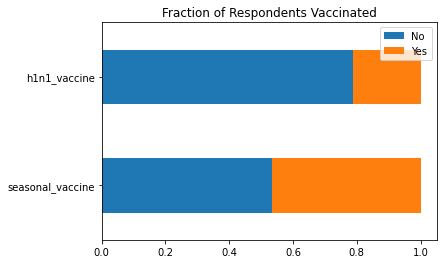

In [6]:
# barplot of 2-way table
df1.plot(kind='barh', stacked=True, title='Fraction of Respondents Vaccinated')
plt.legend(loc='upper right')

#### Imbalance Discussion
In regards to the `seasonal_vaccine` target, this variable is balanced with the possible responses, 'No' (0) and 'Yes' (1) both being about 50% in the data.

As shown in the  description of the data, the `h1n1_vaccine` variable is not blanced. This is identified with a mean of about 0.2. My prediction only needs to target one possible vaccination thus I will not be using `h1n1_vaccine` variable as a target.

### 2. Identify duplicated data

In [7]:
# Duplicates

## After merging the datasets the column respondent_id is duplicated.
## Delete both columns because they are unnecessary
data.drop(['respondent_id'], axis=1, inplace=True)

# Look at the rest of the data for duplicates
duplicates_len = data.duplicated().sum()
print(f"Results:\nThere are {duplicates_len} duplicated records.")


Results:
There are 0 duplicated records.


#### Duplicated Data Discussion
According to my results there is no duplicated data in this dataset.

### 3. Identify missing data

In [8]:
# null values
print(f'''
There is {data.shape[0]} records and 
{data.shape[1]} variable in the dataset.
''')

fraction_na = data.isna().sum()/len(data)

print(f'Fraction of Missing values\n-------------------------\n{fraction_na.sort_values(ascending=False)}')


There is 26707 records and 
37 variable in the dataset.

Fraction of Missing values
-------------------------
employment_occupation          0.504362
employment_industry            0.499120
health_insurance               0.459580
income_poverty                 0.165612
doctor_recc_h1n1               0.080878
doctor_recc_seasonal           0.080878
rent_or_own                    0.076459
employment_status              0.054780
marital_status                 0.052720
education                      0.052683
chronic_med_condition          0.036358
child_under_6_months           0.030704
health_worker                  0.030104
opinion_seas_sick_from_vacc    0.020107
opinion_seas_risk              0.019246
opinion_seas_vacc_effective    0.017299
opinion_h1n1_sick_from_vacc    0.014790
opinion_h1n1_vacc_effective    0.014640
opinion_h1n1_risk              0.014528
household_adults               0.009323
household_children             0.009323
behavioral_avoidance           0.007788
behaviora

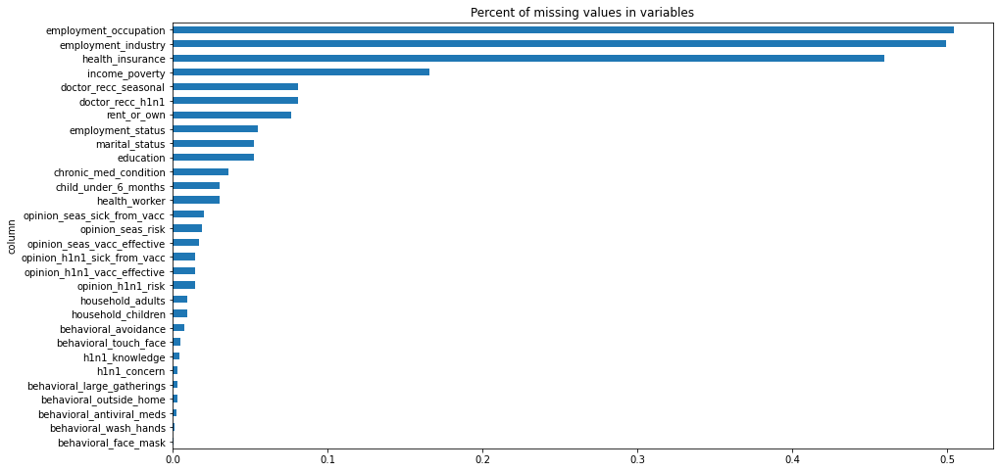

In [9]:
import pylab
import matplotlib.pyplot as plt

def plot_missing_values(df):
    # Attribute: https://marloz.github.io/projects/sklearn/pipeline/missing/preprocessing/2020/03/20/sklearn-pipelines-missing-values.html
    """ For each column with missing values plot proportion that is missing."""
    dataset = [(col, df[col].isnull().sum() / len(df)) 
            for col in df.columns if df[col].isnull().sum() > 0]
    col_names = ['column', 'percent_missing']
    missing_df = pd.DataFrame(dataset, columns=col_names).sort_values('percent_missing')
    pylab.rcParams['figure.figsize'] = (15, 8)
    missing_df.plot(kind='barh', x='column', y='percent_missing')
    plt.title('Percent of missing values in variables')
    plt.gca().get_legend().remove()
    
    
plot_missing_values(data)

### Placeholders for missing data

In [10]:
# Any placeholders?
# Look for top occuring values
print('2009 National Influenza Survey\n')
for col in data.columns:
    print(col, '\n', data[col].value_counts(normalize = True).head(10), '\n')

2009 National Influenza Survey

h1n1_concern 
 2.0    0.397332
1.0    0.306331
3.0    0.172497
0.0    0.123840
Name: h1n1_concern, dtype: float64 

h1n1_knowledge 
 1.0    0.548983
2.0    0.356775
0.0    0.094242
Name: h1n1_knowledge, dtype: float64 

behavioral_antiviral_meds 
 0.0    0.951156
1.0    0.048844
Name: behavioral_antiviral_meds, dtype: float64 

behavioral_avoidance 
 1.0    0.725612
0.0    0.274388
Name: behavioral_avoidance, dtype: float64 

behavioral_face_mask 
 0.0    0.931018
1.0    0.068982
Name: behavioral_face_mask, dtype: float64 

behavioral_wash_hands 
 1.0    0.825614
0.0    0.174386
Name: behavioral_wash_hands, dtype: float64 

behavioral_large_gatherings 
 0.0    0.64136
1.0    0.35864
Name: behavioral_large_gatherings, dtype: float64 

behavioral_outside_home 
 0.0    0.662685
1.0    0.337315
Name: behavioral_outside_home, dtype: float64 

behavioral_touch_face 
 1.0    0.677264
0.0    0.322736
Name: behavioral_touch_face, dtype: float64 

doctor_recc_h1n1

In [11]:
# Number of observations with at least 1 missing value
print(f'No. of rows with at least 1 missing value: {len(data.loc[data.isna().any(axis=1)])}')

No. of rows with at least 1 missing value: 20270


In [12]:
# Number of observations with all variables missing
print(f'No. of rows with all missing values: {len(data.loc[data.isna().all(axis=1)])}')

No. of rows with all missing values: 0


#### Discussion 
* Large porportion of missing data for `health_insurance`, `employment_industry`, and `employment_occupation`
* No missing data in `age_group`, `race`, `sex`, `hhs_geo_region`, and `census_msa`
* In `race`, hispanic is an option while on the U.S. Census it is listed as an ethnicity.
* There is an equal number of `NA` in `household_adults` and `household_children`
* There is an equal number of `NA` in `doctor_recc_h1n1` and `doctor_recc_seasonal`
* census_msa: msa means metropolitan statistical area. 
    * MSA = urban
    * MSA, Not Prinicple city = suburban
    * Non-MSA = rural
* `hhs_geo_region` is in code and won't be meaningful
* `employment_history` is coded and won't be meaningful
* `employment_occupation` is coded and won't be meaningful

#### Correcting Missing Data
The [original documentation](https://www.cdc.gov/nchs/nis/data_files_h1n1.htm) for the survey indicates the respondent can refuse to answer a question so the missing data may be due to error, refusal, or mistakes. There is a large amount of missing data in `health_insurance`, `income_poverty`, `employment_industry`, and `employment_occupation` which may be due to refusal to answer a question out of privacy conerns by the respondent. The variables `age_group`, `race`, `sex`, `hhs_geo_region`, and `census_msa`have no missing data, while the reamining variables have a minor amount of missing data. I hypothesize that the variables with large porportion of missing data are due to refusal or ignorance. For this reason, I will keep missing data during encoding of the variables and create new variables (`*variable_is_na`) to indicate that this respondent has missing information for that variable.

### 4.  Variable Selection
As shown previously, the variable `h1n1_vaccine` is the respondent's answer to the question if they got the single H1N1 vaccination. This variable is very imbalanced and would not be a good predictor for Moderna's current business problem of whether a person would receive a vaccination. Moderna wants to be able to predict if a person would get a combined seasonal influenza and SARS-Cov-2 vaccination and it would be more logical to use the `seasonal_vaccine` as a target instead of `h1n1_vaccine`.

In [13]:
print(f'Probability of receiving a seasonal flu or H1N1 vaccine')
pd.crosstab(index=data['seasonal_vaccine'], columns=data['h1n1_vaccine'], normalize=True)

Probability of receiving a seasonal flu or H1N1 vaccine


h1n1_vaccine,0,1
seasonal_vaccine,,
0,0.497810,0.036582
1,0.289737,0.175871


The data also shows that it is more common for people that received the H1N1 vaccine to also have received the seasonal flu vaccine. Almost half (50%) of respondents are not vaccinated against the seasonal flu and H1N1. Only 3.6% of respondents claim they received only the H1N1 vaccine and not the seasonal influenza vaccine, but 17.5% of respondents claim they received both the seasonal and H1N1 vaccine. Almost 30% of respondents claim they only received the seasonal influenza vaccination and not the H1N1 vaccine.

Because of the high correlation with receiving the H1N1 vaccine and receiving the seasonal vaccine, the high imbalance in the variable, and no real-world need for this question in the future, this variable will be removed from the analysis.

The variables `hhs_geo_region`, `employment_industry`, and `employment_occupation` are all coded so to keep the respondent's privacy. Since will not offer any beneficial information, they will be removed from the dataset.

#### Other H1N1 information
Variables associated with H1N1, such as `H1N1_concern` will be kept and act as a substitute for an emerging respiratory virus such as we are experiencing with COVID-19. While this is not exactly data on SARS-CoV-2, both are highly contagious, new respiratory viruses.

#### Variable Analysis

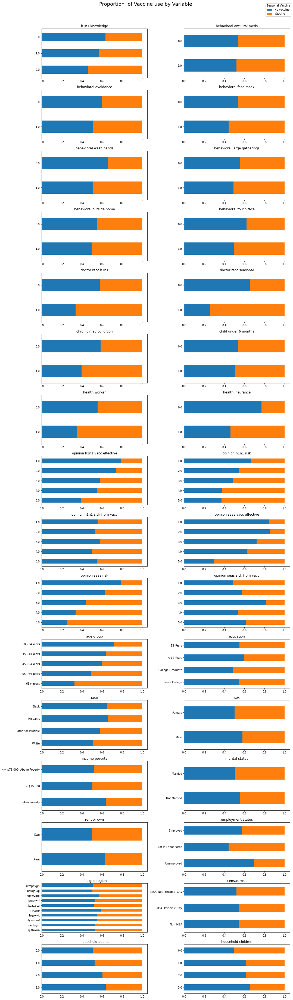

In [14]:
# Feature/Variable data exporation
features = data.columns[1:-4] # select all variables in the data except the targets and respondent_id
target='seasonal_vaccine'
# https://drivendata.co/blog/predict-flu-vaccine-data-benchmark/
# set number of columns
ncols = 2

# calculate number of rows
nrows = len(features) // ncols + (len(features) % ncols > 0)

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 50))
#fig.subplots_adjust(hspace=1.0, wspace=0.2)

# unpack the axes subplots
axe = axes.ravel()

# Assign the plot to each subplot in the axe
for idx, feature in enumerate(features):
    
    # Calculate the counts
    counts = (data[[target, feature]]
                  .groupby([target, feature])
                  .size()
                  .unstack(target))
    group_counts = counts.sum(axis='columns')
    props = counts.div(group_counts, axis='index')
    props.plot(kind="barh", stacked=True, ax=axe[idx])
    
    # Chart formatting
    axe[idx].set_title(feature.replace('_', ' '))
    axe[idx].invert_yaxis()
    axe[idx].legend().remove()
    axe[idx].set_ylabel("")
    axe[idx].set_xlabel("")

fig.tight_layout()
fig.suptitle('Proportion  of Vaccine use by Variable', fontsize=18, y=1.02)
fig.legend(['No vaccine', 'Vaccine'], loc='upper right', bbox_to_anchor=(1, 1.02), title='Seasonal Vaccine')

##### Graph Interpretation
Many of the variables have a positive relationship between them and whether the respondents are vaccinated or unvaccinated. Some of these variables include `opinion_seas_vacc_effective`, `opinion_seas_risk`, `age_group`, `health_insurance`, `doctor_recc_seasonal`, `doctor_recc_h1n1`. The importance of these variables will be determined with the machine learning models.

#### Variable Selection Discussion
The following variables will be removed from the dataset and not used to build the prediction model:


| Variable         | Reason Removed |
| :---------------- | :-------------- |
| `respondent_id`  | Each observation has a specific code |
| `h1n1_vaccine`   | Not realistic for our needs, highly correlated with `seasonal_vaccine`, and only need to predict one vaccination status |
| `hhs_geo_region` | Coded and not interpretable |
| `employment_industry`  | Coded and not interpretable |
| `employment_occupation` | Coded and not interpretable |


In [15]:
# Remove unnecessary or redundant variables
#data_features.drop(['respondent_id'], axis=1, inplace=True)
data.drop(['h1n1_vaccine', 'hhs_geo_region', 'employment_industry', 'employment_occupation'], 
          axis=1, 
          inplace=True)


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   h1n1_concern                 26615 non-null  float64
 1   h1n1_knowledge               26591 non-null  float64
 2   behavioral_antiviral_meds    26636 non-null  float64
 3   behavioral_avoidance         26499 non-null  float64
 4   behavioral_face_mask         26688 non-null  float64
 5   behavioral_wash_hands        26665 non-null  float64
 6   behavioral_large_gatherings  26620 non-null  float64
 7   behavioral_outside_home      26625 non-null  float64
 8   behavioral_touch_face        26579 non-null  float64
 9   doctor_recc_h1n1             24547 non-null  float64
 10  doctor_recc_seasonal         24547 non-null  float64
 11  chronic_med_condition        25736 non-null  float64
 12  child_under_6_months         25887 non-null  float64
 13  health_worker   

### 5. Encode variables

All varaibles will be One-Hot-Encoded (OHE) and missing values will be given their own category. Some variables are oridinal but that extra information is unnecessary for the models I will be using.

In [17]:
from sklearn.model_selection import train_test_split

y = data['seasonal_vaccine'] # target
X = data.drop('seasonal_vaccine', axis=1) # features

# Train-test split
SEED = 42 # seed to set random_state for all models
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.25, 
                                                    random_state=SEED)

In [18]:
# import OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

# Initialize
ohe = OneHotEncoder()
# fit encoder on X data
ohe.fit(X_train)
X_train_ohe = ohe.transform(X_train).toarray()

# Dataframe to visualize
X_train_ohe_df = pd.DataFrame(X_train_ohe, columns=ohe.get_feature_names(X_train.columns))

# Modeling

## Model 1: Decision Tree
A decision tree is a machine learning algorithm that builds a tree-based classification model with a collection of if-else statements. It was chosen for this analysis because it is powerful classification tool, solves classification problems, and is easy to interpret. This model used the default values and the splitting criterion was Gini-index. This base model will use the training data to build a decision tree to predict if a person is vaccinated or unvaccinated against the seasonal influenza vaccine.

In [19]:
# Decision Tree
# Modeling
# Base model: Decision Tree
from sklearn import tree
from sklearn import metrics
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer, recall_score, precision_score

dt_clf = tree.DecisionTreeClassifier()

# Make specificity scorer
# https://stackoverflow.com/questions/64538838/using-cross-validation-for-calculating-specificity
# Specificity is the recall of the negative class
specificity = make_scorer(recall_score, pos_label=0)
npv = make_scorer(precision_score, pos_label=0)

# Make scoring method
# https://stackoverflow.com/a/35886445/1144724

scoring = {'accuracy': 'accuracy',
           'precision': 'precision',
           'recall': 'recall',
           'f1': 'f1',
           'specificity': specificity,
           'NPV': npv}

dt_clf_cv = cross_validate(dt_clf, 
                           X_train_ohe_df, 
                           y_train, 
                           scoring = scoring,
                           cv=5)

# Output Cross-validated metrics
print('Cross Validated Training Scores')
for key in dt_clf_cv:
    if key != 'fit_time' and key != 'score_time':
        print(f'Decision Tree {key}: {dt_clf_cv[key].mean():.2%}')
    
    

Cross Validated Training Scores
Decision Tree test_accuracy: 67.79%
Decision Tree test_precision: 65.37%
Decision Tree test_recall: 66.64%
Decision Tree test_f1: 65.99%
Decision Tree test_specificity: 68.81%
Decision Tree test_NPV: 70.02%


### Model 1 Evaluation
Model 1 has a accuracy, precision, recall, f1-score, and specificity in the upper 60% range. This is low for a prediction model and may be able to be increased by tuning the hyperparameters of the decision tree and using other machine learning algorithms such as Random Forests and Gradient Boosting (XGBoost). The next models will implement these and the metrics will be reported in Model Evaluation.

## Model 2: Tuned Decision Tree
Model 1 can be improved by searching for the best hyperparameters to tune the decision tree to avoid over and underfitting.
Two different algorithms will be ued. The first is `sklearn` `RandomizedSearchCV` which will randomly search over a set of specified hyperparameters. Then `GridSearchCV` is used to find tune the best hyperparemeters found by `RandomizedSearchCV`.

The hyperparameters that will be tuned include
* `criterion`: The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “log_loss” and “entropy” both for the Shannon information gain
* `splitter`: The strategy used to choose the split at each node. Supported strategies are “best” to choose the best split and “random” to choose the best random split.
* `max_depth`: The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples. 
* `min_samples_split`: The minimum number of samples required to split an internal node.
* `min_samples_leaf`: The minimum number of samples required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches.
* `max_features`: The number of features to consider when looking for the best split.

In [20]:
# Model 2: Tune DecisionTree using RandomizedSearchCV and GridSearchCV

# Start by using RandomizedSearchCV to narrow down the range for each
## hyperparameter

from sklearn.model_selection import RandomizedSearchCV

# Create the random grid
max_depth = [int(x) for x in range(0, 55, 5)]
max_depth.append(None)
dt_param_grid = {'criterion': ['gini', 'entropy', 'log-loss'],
               'splitter': ['best', 'random'],
                # Number of features to consider at every split
               'max_features': ['auto', 'sqrt', 'log2'],
                # Maximum number of levels in tree
               'max_depth': max_depth,
                # Minimum number of samples required to split a node
               'min_samples_split': [int(x) for x in range(2, 22, 2)],
                # Minimum number of samples required at each leaf node
               'min_samples_leaf': [int(x) for x in range(5, 50, 5)]}

# Base model to tune
dt = tree.DecisionTreeClassifier(random_state=SEED)

# Random search of parameters, using 5 fold cross validation, 
dt_random = RandomizedSearchCV(estimator = dt, 
                               param_distributions = dt_param_grid, 
                               n_iter = 1000, 
                               cv = 5, 
                               verbose=1, 
                               random_state=SEED, 
                               n_jobs = -1) # use all availabel cores

# Fit the random search model
dt_random.fit(X_train_ohe_df, y_train)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [0.70589116 0.71912132 0.70863704        nan        nan 0.71003495
 0.71817274        nan 0.73325012 0.71712431        nan 0.73290065
 0.72910634        nan 0.71967049        nan        nan 0.72770844
        nan 0.7129306         nan        nan 0.71083375 0.71827259
 0.73205192        nan 0.72606091 0.71762356        nan 0.72800799
 0.73090364 0.73170245        nan 0.70104843 0.71337993        nan
 0.71083375 0.7202696         nan 0.71782327 0.72935597 0.72606091
 0.7119321  0.73325012        nan 0.72471293 0.7105342         nan
 0.73290065 0.73265102        nan 0.73369945 0.72930604 0.7129306
 0.71967049 0.73290065 0.72551173 0.73434848        nan        nan
        nan        nan 0.71617574 0.73270095        nan 0.71617574
        nan 0.73105342 0.72471293 0.73295057        nan 0.73325012
 0.71967049 0.71342986 0.73195207 0.73195207 0.7319520

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
                   n_iter=1000, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log-loss'],
                                        'max_depth': [0, 5, 10, 15, 20, 25, 30,
                                                      35, 40, 45, 50, None],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [5, 10, 15, 20, 25,
                                                             30, 35, 40, 45],
                                        'min_samples_split': [2, 4, 6, 8, 10,
                                                              12, 14, 16, 18,
                                                              20],
                                        'splitter': ['best', 'ra

In [21]:
# Best parameters in the Random Search grid
dt_random.best_params_

{'splitter': 'best',
 'min_samples_split': 6,
 'min_samples_leaf': 25,
 'max_features': 'auto',
 'max_depth': 15,
 'criterion': 'gini'}

In [22]:
# Use best parameters from RandomSearchCV and put in Grid Search to fine tune
# the hyperparameters

from sklearn.model_selection import GridSearchCV

# Make a new parameter grid based on the best parameters from the RandomSearchCV
dt_param_grid = {
    'splitter':[dt_random.best_params_['splitter']],
    'criterion':[dt_random.best_params_['criterion']],
    'max_features':[dt_random.best_params_['max_features']],
    'max_depth':[int(x) for x in range((dt_random.best_params_['max_depth']-5),
                                       (dt_random.best_params_['max_depth']+5),
                                       1)],
    'min_samples_split':[int(x) for x in range((dt_random.best_params_['min_samples_split']-5),
                                               (dt_random.best_params_['min_samples_split']+5),
                                               1)],
    'min_samples_leaf':[int(x) for x in range(dt_random.best_params_['min_samples_leaf']-5,
                                              dt_random.best_params_['min_samples_leaf']+5,
                                              1)]
}

# Initialize GridSearchCV
dt_grid = GridSearchCV(dt,
                      param_grid=dt_param_grid,
                      cv=3,
                      return_train_score=False,
                      n_jobs = -1,
                      verbose=1)

# Fit data using GridSearchCV object
dt_grid.fit(X_train_ohe_df, y_train)

Fitting 3 folds for each of 1000 candidates, totalling 3000 fits


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan 0.72371406 0.72371406 0.72371406 0.72371406 0.72371406
 0.72371406 0.72371406 0.72371406 0.72371406        nan 0.73574679
 0.73574679 0.73574679 0.73574679 0.73574679 0.73574679 0.73574679
 0.73574679 0.73574679        nan 0.72855738 0.72855738 0.72855738
 0.72855738 0.72855738 0.72855738 0.72855738 0.72855738 0.72855738
        nan 0.73265155 0.73265155 0.73265155 0.73265155 0.73265155
 0.73265155 0.73265155 0.73265155 0.73265155        nan 0.73804269
 0.73804269 0.73804269 0.73804269 0.73804269 0.73804269 0.73804269
 0.73804269 0.73804269        nan 0.73080397 0.73080397 0.73080397
 0.73080397 0.73080397 0.73080397 0.73080397 0.73080397 0.73080397
        nan 0.73559717 0.73559717 0.73559717 0.73559717 0.73559717
 0.73559717 0.73559717 0.73559717 0.73559717        nan 0.72775875
 0.72775875 0.72775875 0.72775875 0.72775875 0.727758

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'],
                         'max_depth': [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
                         'max_features': ['auto'],
                         'min_samples_leaf': [20, 21, 22, 23, 24, 25, 26, 27,
                                              28, 29],
                         'min_samples_split': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'splitter': ['best']},
             verbose=1)

In [23]:
# Best parameters according to GridSearchCV
dt_grid.best_params_

{'criterion': 'gini',
 'max_depth': 15,
 'max_features': 'auto',
 'min_samples_leaf': 28,
 'min_samples_split': 2,
 'splitter': 'best'}

In [24]:
# Extracting the importances from Model 2
importances_sk = dt_grid.best_estimator_.fit(X_train_ohe, y_train).feature_importances_

# Create a dataframe with the feature importance by sklearn
feature_importance_sk = {}
for i, feature in enumerate(X_train_ohe_df.columns):
    feature_importance_sk[feature] = round(importances_sk[i], 3)

# Display table in order of importance
print('Feature Importance According to Model 2')
display(pd.DataFrame(feature_importance_sk.items(), 
                     columns=['Feature', 
                              'Importance']).sort_values('Importance', ascending=False).head(15))


Feature Importance According to Model 2


,Feature,Importance
33,doctor_recc_seasonal_0.0,0.275
70,opinion_seas_vacc_effective_5.0,0.135
34,doctor_recc_seasonal_1.0,0.103
88,age_group_65+ Years,0.067
72,opinion_seas_risk_1.0,0.049
52,opinion_h1n1_vacc_effective_5.0,0.029
75,opinion_seas_risk_4.0,0.026
73,opinion_seas_risk_2.0,0.023
46,health_insurance_1.0,0.022
42,health_worker_0.0,0.021


In [25]:
# Decision Tree Plot
import numpy as np

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(55,25), dpi=600)
tree.plot_tree(dt_grid.best_estimator_.fit(X_train_ohe_df, y_train), # choose best params
               feature_names = X_train_ohe_df.columns,
               class_names=np.unique(y_train).astype('str'),
               filled = True, 
               rounded=True, 
               fontsize=5,
               impurity='False',
               label='root')

plt.savefig('images/decision_tree_plot.pdf')
plt.savefig('images/decision_tree_plot.png')
plt.show()
plt.close()

## Model 3: Random Forest
A decision tree will maximize the information gain at every branch. This may lead to overfittting. 

Random Forest is a machine learning algorithm that uses a bagging technique. This bagging technique uses various decision trees on subsets of the dataset. So instead of relying on one decision tree, the model from the Random Forest algorithm predicts the final output based on the majority vote of all the decision trees in the forest. This leads to a reduction of overfitting.

The hyperparameters used were the best hyperparameters found during the search in model 2.

In [26]:
# Instantiate and fit a Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

# Start with hyperparemeters from Decision Tree Grid Search Best Parameters
forest = RandomForestClassifier(random_state=SEED,
                                max_samples=1000,
                                criterion=dt_grid.best_params_['criterion'],
                                max_depth=dt_grid.best_params_['max_depth'],
                                max_features=dt_grid.best_params_['max_features'],
                                min_samples_leaf=dt_grid.best_params_['min_samples_leaf'],
                                min_samples_split=dt_grid.best_params_['min_samples_split'])

forest.fit(X_train_ohe_df, y_train)

RandomForestClassifier(max_depth=15, max_samples=1000, min_samples_leaf=28,
                       random_state=42)

## Model 4: Tuned Random Forest
Random Forest classifiers can also be tuned using hyperparameters similarly to decision trees. Due to computational limits only RandomSearchGrid will be used to find the best hyperparameters that limit under and overfitting.

The hyperparameters optimized include:
* criterion: The function to measure the quality of a split.
* n_estimators: The number of trees in the forest
* max_depth: The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
* max_features: The number of features to consider when looking for the best split.
* min_samples_split: The minimum number of samples required to split an internal node.
* min_samples_leaf: The minimum number of samples required to be at a leaf node. 
* bootstrap: Whether bootstrap samples are used when building trees.

In [28]:
# Random Forest Hyperparameter Tuning

from sklearn.model_selection import RandomizedSearchCV

# Create the random grid parameters
max_depth = [int(x) for x in range(0, 55, 5)]
max_depth.append(None)

random_grid_rf = {
    'criterion': ['gini', 'entropy'],
    # Number of trees in the forest
    'n_estimators': [100, 500, 1000],
    # Number of features to consider when looking for the best split
    'max_features': ['auto', 'sqrt', 'log2', None],
    # Maximum number of levels in tree
    'max_depth': max_depth,
    # Minimum number of samples required to split a node
    'min_samples_split': [int(x) for x in range(2, 22, 2)],
    # Minimum number of samples required at each leaf node
    'min_samples_leaf': [int(x) for x in range(5, 50, 5)],
    # If bootstrapped samples are used to build trees
    'bootstrap': [True, False]}

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier(random_state=SEED, n_jobs=-1)

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, 
                               param_distributions = random_grid_rf, 
                               n_iter = 50, 
                               cv = 3, 
                               random_state=SEED, 
                               n_jobs = -1, # all available cores
                               verbose=1)
# Fit the random search model
rf_random.fit(X_train_ohe_df, y_train)


Fitting 3 folds for each of 50 candidates, totalling 150 fits


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [0.76809788        nan 0.77718426 0.77543693 0.77259125 0.77418883
 0.77234156 0.77413878 0.77583634 0.77044444 0.74792812 0.77299066
 0.77623568 0.76240651        nan 0.77458815 0.77049433 0.77828263
        nan 0.77843252 0.7778333  0.77204207 0.76984536 0.76260627
 0.77563663 0.77348994 0.77344003 0.77693464 0.77229164        nan
 0.76944591 0.77703449 0.75876202 0.7626062  0.77423873 0.75436843
 0.77284083 0.7775338  0.77259125 0.77274096 0.77523722 0.760809
 0.77329019 0.77184236 0.77398911 0.77648531 0.7477285  0.7739392
 0.74019004 0.77099359]
  warnings.warn(


RandomizedSearchCV(cv=3,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [0, 5, 10, 15, 20, 25, 30,
                                                      35, 40, 45, 50, None],
                                        'max_features': ['auto', 'sqrt', 'log2',
                                                         None],
                                        'min_samples_leaf': [5, 10, 15, 20, 25,
                                                             30, 35, 40, 45],
                                        'min_samples_split': [2, 4, 6, 8, 10,
                                                              12, 14, 16, 18,
                                                              20],
                            

In [29]:
# Extracting the importances from Model 4
importances_sk = rf_random.best_estimator_.feature_importances_

# Create a dataframe with the feature importance by sklearn
feature_importance_sk = {}
for i, feature in enumerate(X_train_ohe_df.columns):
    feature_importance_sk[feature] = round(importances_sk[i], 3)

# Display table in order of importance
print('Feature Importance According to Model 4')
forest_importance_df = pd.DataFrame(feature_importance_sk.items(), 
                               columns=['Feature', 
                              'Importance']).sort_values('Importance', ascending=False).head(15)
display(forest_importance_df)

Feature Importance According to Model 4


,Feature,Importance
70,opinion_seas_vacc_effective_5.0,0.099
34,doctor_recc_seasonal_1.0,0.075
72,opinion_seas_risk_1.0,0.049
33,doctor_recc_seasonal_0.0,0.042
88,age_group_65+ Years,0.041
75,opinion_seas_risk_4.0,0.038
67,opinion_seas_vacc_effective_2.0,0.024
76,opinion_seas_risk_5.0,0.020
73,opinion_seas_risk_2.0,0.019
84,age_group_18 - 34 Years,0.019


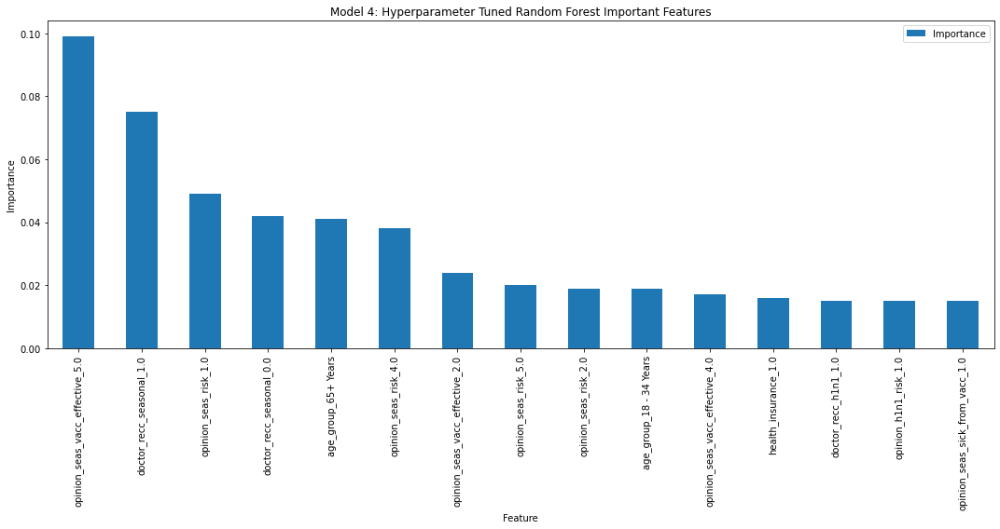

In [30]:
fig, ax = plt.subplots()
forest_importance_df.plot.bar(x='Feature', y='Importance', ax=ax)
ax.set_title("Model 4: Hyperparameter Tuned Random Forest Important Features")
ax.set_ylabel("Importance")
fig.tight_layout()

## Model 5: XGBoost
The final algorithm used is Gradient Boosting (XGBoost) trees. This algorithm uses an ensemble of weak decision trees as it builds the trees. It uses gradient descent to minimize the loss function. With this information it concentrates on where the model went wrong and creates new learners and continuously improves. XGBoost has been found to outperform Random Forests in many instances [9](#Ref-9).

In [95]:
# XGBoost Model
from xgboost import XGBClassifier

# XGBoost requires all classification categories be integers that count up from 0.
# Which is met

# Make parameter grid
param_grid = {
    'base_score': [0.25, 0.5, 0.75, 1],
    'learning_rate': [0.01, 0.1, 0.5, 1],
    'max_depth': [1, 10, 100],
    'min_child_weight': [1, 2],
    'subsample': [0.5, 0.75, 1],
    'n_estimators': [10, 100, 1000],
}

# Grid Search of XGBoost clsassifier
xgb_clf = XGBClassifier(use_label_encoder=False,
                        random_state=SEED)
                        ## All my variables are one-hot encoded so they have 0 and 1 as their only values
                        ## so I do not need to transform the data.

xgb_random = RandomizedSearchCV(xgb_clf, 
                              param_grid, 
                              #scoring=scoring,
                              cv=3, 
                              n_jobs=-1,
                              verbose=1)

# Must input .values because of the following error:
## feature_names must be string, and may not contain [, ] or < so use .values
xgb_random.fit(X_train_ohe_df.values, y_train.values)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [0.7566652  0.7513731  0.77853234 0.53110335 0.69800448 0.77703466
 0.7633051         nan        nan        nan]
  warnings.warn(


[14:56:59] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           enable_categorical=False, gamma=None,
                                           gpu_id=None, importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints...
                                           reg_alpha=None, reg_lambda=None,
                                           scale_pos_weight=None,
                                       

In [96]:
best_parameters = xgb_random.best_params_

print('Randomized Search found the following optimal parameters: ')
for param_name in sorted(best_parameters.keys()):
    print('%s: %r' % (param_name, best_parameters[param_name]))

Randomized Search found the following optimal parameters: 
base_score: 0.25
learning_rate: 1
max_depth: 1
min_child_weight: 2
n_estimators: 1000
subsample: 0.75


In [97]:
# Extracting the importances from Model 5
importances_sk = xgb_random.best_estimator_.feature_importances_

# Create a dataframe with the feature importance by sklearn
xgboost_importance_sk = {}
for i, feature in enumerate(X_train_ohe_df.columns):
    xgboost_importance_sk[feature] = round(importances_sk[i], 3)

# Display table in order of importance
print('Feature Importance According to Model 5')
xgboost_importance_df = pd.DataFrame(xgboost_importance_sk.items(), 
                               columns=['Feature', 
                              'Importance']).sort_values('Importance', ascending=False).head(15)
display(xgboost_importance_df)

Feature Importance According to Model 5


,Feature,Importance
70,opinion_seas_vacc_effective_5.0,0.243
72,opinion_seas_risk_1.0,0.138
88,age_group_65+ Years,0.093
34,doctor_recc_seasonal_1.0,0.068
73,opinion_seas_risk_2.0,0.043
69,opinion_seas_vacc_effective_4.0,0.026
71,opinion_seas_vacc_effective_nan,0.024
108,rent_or_own_Rent,0.023
43,health_worker_1.0,0.015
78,opinion_seas_sick_from_vacc_1.0,0.014


In [98]:
# Pickle these models so don't have to run models again
import joblib
import pickle

#Model 1
with open('pickled_models/decision_tree_model.pkl', 'wb') as f:
    joblib.dump(dt_clf, f)

#Model 2
with open('pickled_models/decision_tree_grid.pkl', 'wb') as f:
    joblib.dump(dt_grid, f)

#Model 3
with open('pickled_models/random_forest.pkl', 'wb') as f:
    joblib.dump(forest, f)

# Model 4
with open('pickled_models/random_forest_grid.pkl', 'wb') as f:
    joblib.dump(rf_random, f)

# Model 5
with open('pickled_models/xgboost.pkl', 'wb') as f:
    joblib.dump(xgb_random, f)

# Model Evaluation

Moderna wants to be able to predict who will and will not get the vaccine. With this information Moderna can organize resources to enable more people to be vaccinated. For example, a person may be predicted to not get the vaccine. This person can be given literature or informed by a healthcare representative on the harms of the virus and the efficacy of the vaccine. A person that is predicted to get the vaccine can be followed up with a reminder to get the vaccine.

In our situation, false positives are more harmful than false negatives thus we want to limit false positives. This is because falsly predicting that someone will not get the vaccine when in fact they will (false negative) is less harmful than if the model predicts that someone will get the vaccine but in fact they will not (false positive). People falsely predictded to get the vaccine (false positive) would not be put into the propert treatment of encouring them to get vaccinated.

In this regard the most important metrics are those that minimize false positives, which include, specificity, sensitivity, F1-score, and negative predictive value (NPV).


## Specificity

$$ specificity = \frac{TN}{(TN+FP)} $$

Also called the True Negative Rate (TNR), specificity quantifies of how well a test can identify true negatives. The specificity score would be what percent of those negative vaccination outcomes did the model predict correctly.

We want to limit false positive in our situation because that outcome can have more harmful effects on the patient. The sensitivity metric is penalized with more false positives and is the most important metric in our situation. A false positive denotes respondents that indicated they did not get a vaccination but were incorrectly given the positive assignment by the model.

## Precision
Also known as the Positive Predictive Value (PPV), precision is the ratio of the positives that are correctly identified by the model over total positive records. Precision measures the proportion of positively predicted labels that are actually correct.

$$precision = \frac{TP}{(TP+FP)}$$

Precision answers the question, out of all the respondents the model predicted were vaccinated, how many times did the respondent actually have the vaccine? 

Precision is sensitive to false positive values and the lower the number of false positives, the higher the precision score. 

## Recall
Also known as sensitivity and the True Positive Rate (TPR), recall represents the model’s ability to correctly predict the positives out of actual positives. 

$$ sensitivity = \frac{TP}{(TP + FN)}$$

Sensitivity answers the question, out of all the respondents that actually got the vaccine, what percetage of them did our model correctly predict as having the vaccine? The sensitivity score would be what percent of those positive vaccination outcomes did the model predict correctly. 

A high recall/sensitivity score indicates that the model is good at identifying positive examples. This is important for our situation but we also want to do this while still having low false positive results.

## F1-score
The F1 score is a harmonic average of precision and recall/sensitivity. It is often used for binary classifiction models. It measures the ability of the model to predict positive cases and is accurate with the cases it does predict.

$$ F1 = 2 * \frac{precision * recall}{(precision + recall} $$

The F1-score takes both precision and recall into account. The higher the precision and recall, the higher the F1-score.

## Negative Predictive Value

The negative predictive value (NPV) is the probability that subjects that are predicted to be negative actually do not get the vaccine.

$$ NPV = \frac{TN}{(TN+FN)} $$

In our situation NPV calculates the porportion of subjects predicted as not getting vaccinated when in truth they will not be vaccinated. In cases where our model predicts a subject as not being negative, this is how likely they would not get vaccinated.


In [121]:
# Make a list of all the model classifier objects
classifiers = {'M2: Hyperparemeter Tuned Decision Tree': dt_grid, 
              'M3: Random Forest': forest, 
              'M4: Hyperparameter Tuned Random Forest': rf_random, 
              'M5: Hyperparameter Tuned XGBoost': xgb_random
              }

![Example Confusion Matrix](images/confusion-matrix.png)

In [122]:
# Plot Confusion Matrix of Training Data
from sklearn.metrics import plot_confusion_matrix

# Dataframe to visualize
def confusion_matrix_models_plot(model_name_dict, features, target, training=True, save_plot = False):
    '''
    Plot confusion matrix for your models
    '''    
    fig, axes = plt.subplots(nrows=len(model_name_dict)//2, ncols=len(model_name_dict)//2, figsize=(15,10))
    
    # set fiture title
    if training:
        title = 'Training Data Confusion Matrix'
    else:
        title = 'Testing Data Confusion Matrix'
        
    fig.suptitle(title, fontsize=15)
    
    # Loop through  models and generate a confusion_matrix
    for cls, ax in zip(model_name_dict, axes.flatten()):
        plot_confusion_matrix(model_name_dict[cls], 
                              features, 
                              target, 
                              ax=ax, 
                              cmap='Blues',
                              display_labels=None)
        ax.title.set_text(cls)
    plt.tight_layout()  
    plt.show()
    

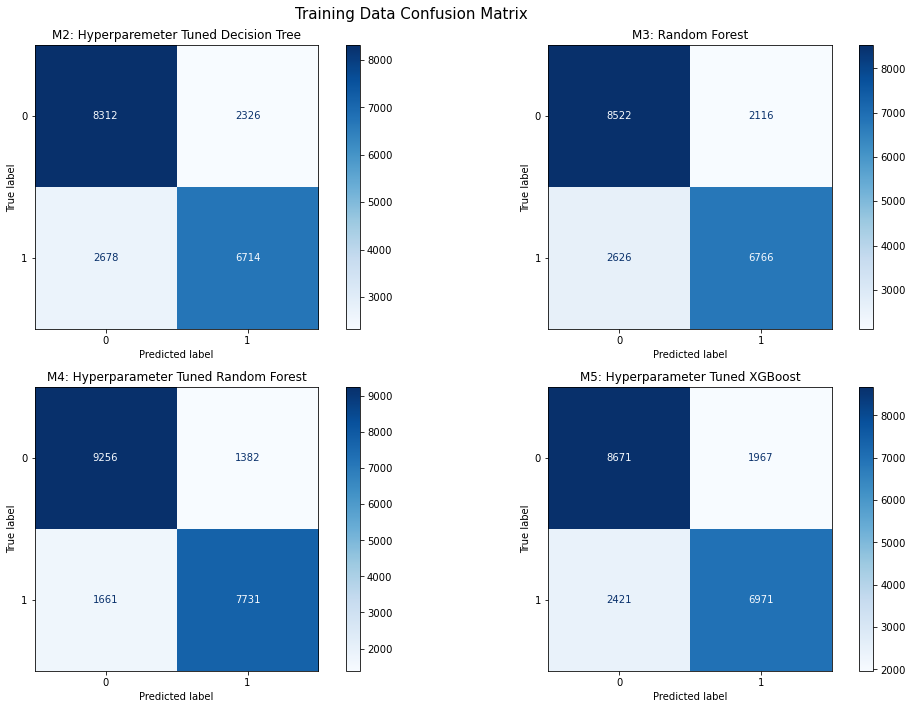

In [123]:
# Training Data Confusion Matrix for each classifier model
#X_train_ohe_df = pd.DataFrame(X_train_ohe, columns=ohe.get_feature_names(X_train.columns))
confusion_matrix_models_plot(classifiers, X_train_ohe_df, y_train, True, False)

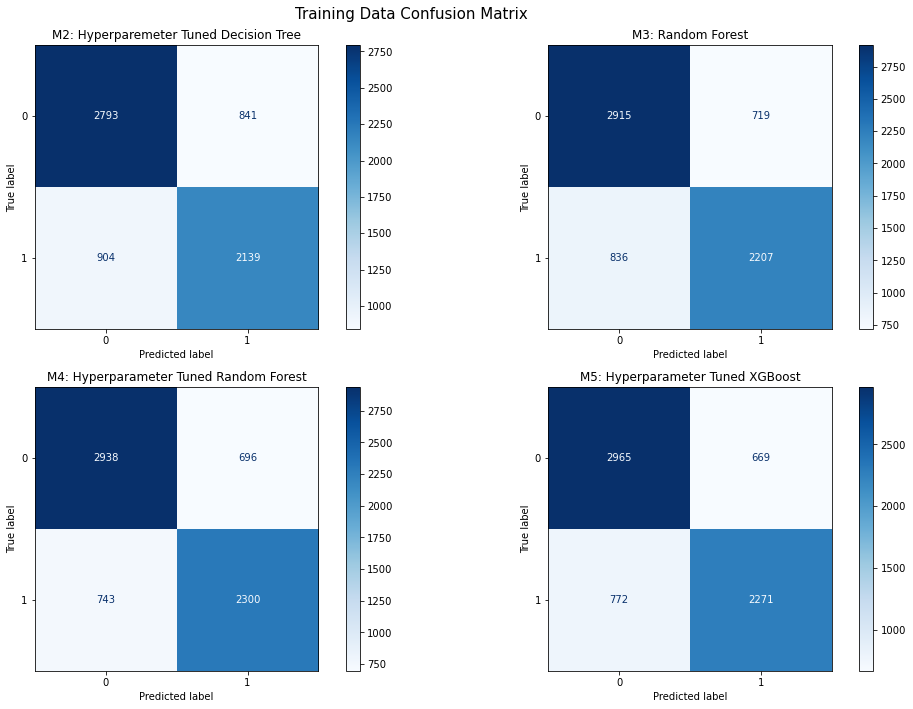

In [124]:
# Testing Data For each classifier model

# One-Hot encode testing features
X_test_ohe = ohe.transform(X_test).toarray()

# Dataframe to visualize
X_test_ohe_df = pd.DataFrame(X_test_ohe, columns=ohe.get_feature_names(X_test.columns))

# Wrapper plot function
confusion_matrix_models_plot(classifiers, X_test_ohe_df, y_test, True, False)

In [125]:
def metric_measurements(model, features, target):
    from sklearn import metrics
    
    predict = model.predict(features) # make predictions from features
    tn, fp, fn, tp = metrics.confusion_matrix(target, predict).ravel()
    
    report = {} # initialize dictionary
    
    metric_report = metrics.classification_report(target, predict, output_dict=True)
    # Accuracy
    report['accuracy'] = metric_report['accuracy']
    # Precision
    report['precision'] = metric_report['1']['precision']
    # Recall or Sensitivity
    report['recall'] = metric_report['1']['recall']
    # F1 score
    report['f1_score'] = metric_report['1']['f1-score']
    # Specificity or recall of negative case
    report['specificity'] = metric_report['0']['recall'] # tn/(tn+fp)
    # Negative Predictive Value
    report['NPV'] = tn/(tn+fn)
    
    return report


In [126]:
# This function builds a dataframe for models and their performance metrics
def metric_df(model_dict, X, y):
    # got help from https://stackoverflow.com/questions/28669482/appending-pandas-dataframes-generated-in-a-for-loop
    results = []
    
    for key in model_dict:
        report = metric_measurements(model_dict[key], X, y)
        df_temp = pd.DataFrame.from_records(report, index=[key])
        results.append(df_temp)
    
    results = pd.concat(results)
    
    return results       



------------Training Data Model Metrics------------


,NPV,accuracy,f1_score,precision,recall,specificity
M2: Hyperparemeter Tuned Decision Tree,0.756324,0.750175,0.728516,0.742699,0.714864,0.781350
M3: Random Forest,0.764442,0.763255,0.740506,0.761765,0.720400,0.801090
M4: Hyperparameter Tuned Random Forest,0.847852,0.848078,0.835558,0.848349,0.823147,0.870088
M5: Hyperparameter Tuned XGBoost,0.781735,0.780929,0.760611,0.779928,0.742227,0.815097




------------Testing Data Model Metrics-------------



,NPV,accuracy,f1_score,precision,recall,specificity
M2: Hyperparemeter Tuned Decision Tree,0.755477,0.738655,0.710277,0.717785,0.702925,0.768575
M3: Random Forest,0.777126,0.767111,0.739487,0.754272,0.725271,0.802146
M4: Hyperparameter Tuned Random Forest,0.798153,0.784484,0.761716,0.767690,0.755833,0.808476
M5: Hyperparameter Tuned XGBoost,0.793417,0.784185,0.759151,0.772449,0.746303,0.815905


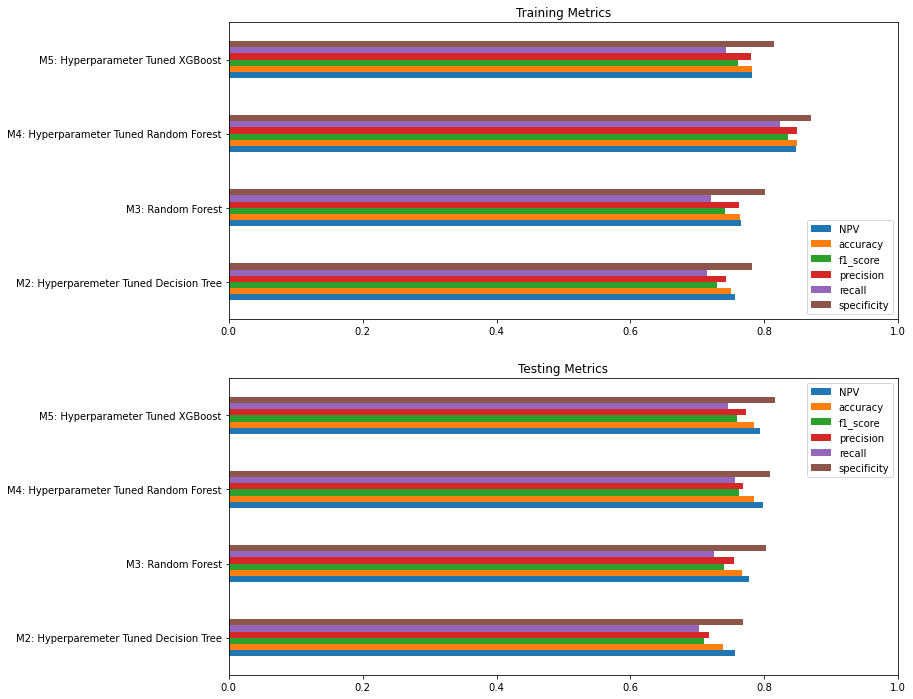

In [128]:
metrics_train_df = metric_df(classifiers, X_train_ohe_df, y_train)
metrics_test_df = metric_df(classifiers, X_test_ohe_df, y_test)

fig, axes = plt.subplots(2,1, figsize=(12,12))
metrics_train_df.plot(kind='barh', ax=axes[0])
metrics_test_df.plot(kind='barh', ax=axes[1])
axes[0].set_xlim(left=0, right=1)
axes[0].title.set_text('Training Metrics')
axes[1].set_xlim(left=0, right=1)
axes[1].title.set_text('Testing Metrics')
print('\n\n------------Training Data Model Metrics------------')
display(metrics_train_df)
print('\n\n------------Testing Data Model Metrics-------------\n')
display(metrics_test_df)

## Model Performance

Model 2 had improvement over model 1 in all reported metrics: accuracy, precision, recall, F1-score, specificity, and NPV. Running the data through a baseline random forest model as in model 3 also increased the metric scores reported as compared with models 1 and 2.

Model 4 and 5 had very similar metric scores but model 5, Hyperparameter tuned XGBoost, has slightly higher values for all metric scores reported except recall and F1-score as compared to model 4. Recall is not as important metric in this analysis as it takes into account false negatives rather than false positivies. In our situation, we want to limit prediction of false positives as this would be more harmful for the patient than predicting false negatives.

Model 5 is the best model found in this analysis. Model 5's specificity of 81.6%. Specificity quantifies how well a test identifies true negatives. This score means that model 5 has an 81.6% chance of predicting someone that does not get the vaccine when they will not actually get it. Model 5 also has an accuracy of 78.5%, precision of 77.2%, and recall of 74.6%. A F1-score is the harmonic mean of precision and recall. It measures the ability of the model to predict positive cases and is accurate with the cases it does predict. Model 5 has an F1-score of 75.9% probability to capture positive cases and be accurate with those cases.

In a real-world setting it is meaningful to predict whether a specific person will actually get vaccinated based on the model's prediction of being vaccinated or unvaccinated. For examle, a health care provider that uses this model to predict if their patient will or will not be vaccinated may ask, 'Given the model predicts a negative vaccination status, what is the probability that this patient will not get vaccinated?' This can be measured using the negative predictive value (NPV). NPV for model 5 is 79.3%. This means 79.3% of respondents that were predicted to not have been vaccinated would truely not have been vaccinated.

NPV is dependent on pre-test probability. In our situation, this is the probability of the presence of the vaccination state before prediction. For our training and testing data, this probability is about half for vaccinated and unvaccinated, but this proportion could change depending on the environment that the model is used in.

All models had variables indicated as the most important. These can be organized into the following categories.
* Opinion of vaccine effectiveness
* Opinion of risk of infection
* Access to healthcare
* Age group

In [127]:
print('M5: XGBoost Variable Importance')
display(xgboost_importance_df)

M5: XGBoost Variable Importance


,Feature,Importance
70,opinion_seas_vacc_effective_5.0,0.243
72,opinion_seas_risk_1.0,0.138
88,age_group_65+ Years,0.093
34,doctor_recc_seasonal_1.0,0.068
73,opinion_seas_risk_2.0,0.043
69,opinion_seas_vacc_effective_4.0,0.026
71,opinion_seas_vacc_effective_nan,0.024
108,rent_or_own_Rent,0.023
43,health_worker_1.0,0.015
78,opinion_seas_sick_from_vacc_1.0,0.014


# Prediction Tool Prototype

This prediction tool gives real time prediction for healthcare workers. A survey can be given to each patient at a clinic or healthcare outreach program. From the patient survey a prediction can be made on if that patient will get a vaccination or not. Patients that are predicted to get a vaccination can be offered one right then if the facilities allow it. Patients that are predicted but want to get vaccinated at another time can be scheduled and/or reminded about the vaccination.

Patients predicted to not get the vaccination would be given additional information about the risk of the seasonal flu and COVID-19, the low risk of vaccination, and the effectivenss of the vaccination in preventing serious illness.

In [129]:
# Randomly select individuals from the testing data

def vaccine_prediction(model, ohe, features, actual):
    '''
    This function takes in a model and Pandas series object and returns
    an estimated price range for the house to be listed.

    Input:
    model = Best model
    ohe = one hot encoder model
    data: Pandas Series with variables needed for the model

    Output:
    Prediction of 1 or 0
    ''' 
    # Did the patient actually get vaccinated?
    pred_index = features.index[0] # get index of new data
    print(f'Index: {pred_index}')
    outcome_results = actual.loc[pred_index]
    
    if outcome_results == 1:
        outcome = 'Vaccinated (1)'
    else:
        outcome = 'NOT Vaccinated (0)'
    
    # Encode the new data
    data_new = ohe.transform(features)
        
    predict_results = model.predict(data_new)[0]
    
    if predict_results == 1:
        predict = 'Vaccinated (1)'
    else:
        predict = 'NOT Vaccinated (0)'
        
        
    print('Information about patient')
    print('-------------------------')
    print(f'Prediction: {predict}')
    print('-------------------------')
    print(f'Truth: {outcome}')
    print('-------------------------')
    print(features.loc[pred_index].squeeze())    
    return outcome_results, predict_results


In [130]:
# Prediction Tool example using randomly select data from testing
vaccine_prediction(xgb_random, ohe, X_test.sample(), y_test)

Index: 16592
Information about patient
-------------------------
Prediction: NOT Vaccinated (0)
-------------------------
Truth: NOT Vaccinated (0)
-------------------------
h1n1_concern                                         2.0
h1n1_knowledge                                       2.0
behavioral_antiviral_meds                            0.0
behavioral_avoidance                                 1.0
behavioral_face_mask                                 0.0
behavioral_wash_hands                                1.0
behavioral_large_gatherings                          1.0
behavioral_outside_home                              0.0
behavioral_touch_face                                0.0
doctor_recc_h1n1                                     0.0
doctor_recc_seasonal                                 0.0
chronic_med_condition                                0.0
child_under_6_months                                 0.0
health_worker                                        0.0
health_insurance            

(0, 0)

# Conclusions and Recommendations

Moderna, Inc. is developing a single-shot seasonal flu and COVID-19 vaccination. Moderna needs to understand what variables influence a person to be vaccinated or unvaccinated and to predict if a patient will be vaccinated or unvaccinated. In this situation, it is more harmful for the model to predict false positive. This is when the model predicts someone will get a vaccine when in fact they will not. Those that are predicted as such will not be given further information on the risks of infection or the effectiveness of the vaccine because they are predicted to be vaccinated. For this reason I used metrics that would penalize predictions that are false positives.

The best model in this analysis is model 5 using XGBoost, but model 4 using hyperparemeter tuned Random Forest is not far behind. The model may be improved by getting more accurate data with less missing values as found in the training data. These missing values may include respondents refusing to answer a question and this is realistic in a real-world setting. For example, people that refuse to answer if a doctor gave a recommendation for the seasonal flu vaccination because they are embarrassed they do not have health insurance. These people may be more likely to not get a vaccination because they do not have access to healthcare. In a real world setting the respondent could be encouraged to answer every question but they may still refuse or give innacurrate answers. In my opinion, it is better to have missing data that denotes a refusal to answer the question rather than incorrect information.

Using the variable importance from this model can help us build proper information materials to provide to people that are hesitant in getting vaccinated. They will be given information that show the effectivenss of the vaccine, the risks of infection with COVID or the seasonal flu, and the convienence of only having a single vaccine for both of these viruses.

These different groups, predicted vaccinated and predicted unvaccinated can be determined in a healthcare facility. Patients are given a survey before visiting a healthcare provider in which the provider's clinic can predict if this is a person that is precited to be vaccinated or unvaccinated. Those predicted to be unvaccinated would be given the information produced from the feature importance and concerns discussed with their healthcare provider.

## Summary
* Moderna is developing a dual seasonal flu and covid-19 vaccination.
* Moderna needs to understand what features lead to vaccination or unvaccination and to predict individuals who will be vaccinated or not.
* Machine learning algorithms such as decistion trees, random forests, and gradient boosting (XGBoost) can solve this problem.
* Specificity is the best metric as it measures the ability of the model to correctly identify not getting a vaccine.
* Model 5 using XGBoost is the best model and has a specificity score of 81.6%.
* The most important features according to model 5 are access to healthcare, opinion on vaccine effectiveness, opinion on risk of infection, and age group.
* This prediciton tool is limited to people with access to healthcare.

## Actionable Recommendation
* Moderna's pharmecutical representatives and healthcare partners will use the prediction tool to predict if a patient will be vaccinated or not.
* Patients would be given a survey before consultation with their healthcare provider and the answers inputted into the prediction tool.
    * Patients predicted to be vaccinated would be given the option to be vaccinated and followed up about their vaccination status
    * Patients predicted to be unvaccinated would be given additional information by their healthcare provider.
        * Patients 55 years or older would be given information based on the risk of infection and disease.
        * Patients younger than 55 years old would be given information about the effectiveness of vaccination.
        * Both groups of patients would have a follow-up call to determine their vaccination status.


# References

#### Ref 1
[(CDC: Disease Burden of Flu)](https://www.cdc.gov/flu/about/burden/index.html)

#### Ref 2
[(CDC: Influenza a Summary for Physicians)](https://www.cdc.gov/flu/professionals/vaccination/vax-summary)

#### Ref 3
[How Influenza (Flu) Vaccines Are Made](https://www.cdc.gov/flu/prevent/how-fluvaccine-made.htm)

#### Ref 4
[mRNA vaccines - a new era in vaccinology](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5906799/)

#### Ref 5
[CDC: Symptoms of COVID-19](https://www.cdc.gov/coronavirus/2019-ncov/symptoms-testing/symptoms.html)

#### Ref 6
[CDC: Stay Up to Date with COVID-19 VAccines Including Boosters](https://www.cdc.gov/coronavirus/2019-ncov/vaccines/stay-up-to-date.html?s_cid=11747:cdc%20up%20to%20date%20vaccine:sem.ga:p:RG:GM:gen:PTN:FY22)

#### Ref 7
[(Yale Medicine: Comparing COVID-19 Vaccines)](https://www.yalemedicine.org/news/covid-19-vaccine-comparison)

#### Ref 8
[(Harvard: Why are mRNA Vaccines So Exciting)](https://www.health.harvard.edu/blog/why-are-mrna-vaccines-so-exciting-2020121021599)

#### Ref 9
[XGBoost Documentation](https://xgboost.readthedocs.io/en/stable/)

# Appendix

# Plots for Stakeholder Presentation

In [131]:
# Function: Crosstabulation Stacked Proportion Plot of 2 variables
def stacked_prop_plot(df, features, axis_order = [None], title=None, save=False):
    '''
    df = the pandas dataframe holding your data
    features = The two categorical features
    axis_order = The order you want the feature groups to be displayed
    title = title of the plot
    save = if you want to save the file as pdf, named as the title
    '''
    
    # Import dependencies
    import warnings
    warnings.filterwarnings('ignore')
    import numpy as np
    import matplotlib.pyplot as plt
    
    
    # arrange data
    data = df[features]
    data.fillna('No Response', inplace=True)

    # Make and display crosstab
    crosstab_df = pd.crosstab(index=data[features[0]], 
                              columns=data[features[1]], 
                              normalize='index')

    # Arrange crosstab_df column order to move No Response to front
    col_order = [e for e in crosstab_df.columns]
    col_order = col_order[-1:]+col_order[:-1]
    crosstab_df = crosstab_df[col_order]
    
        # Rearrange the crosstab index if specified
    if axis_order is None:
        axis_order = [e for e in crosstab_df.index]
        display(crosstab_df.loc[axis_order])
    else:
        display(crosstab_df.loc[(axis_order)])
        axis_order.reverse()
    
    # Plot
    crosstab_df.loc[axis_order].plot(kind='barh', stacked=True, colormap='winter', figsize=(16,12))
    
    # Figure settings
    plt.title(title, fontdict={'fontsize':35})
    legend_title = features[1].replace('_', ' ').title() # legend title
    #plt.legend(loc="lower left", ncol = len(ax.lines) )
    plt.legend(loc=(.25, -.25), ncol = len(col_order), title=legend_title, fontsize=15) # display legend
    
    # X and y axis labels and size
    plt.xlabel(f"Porportion of by respondent's {features[0].replace('_', ' ')} group", fontsize=20)
    plt.ylabel(f"{features[0].replace('_', ' ').title()}", fontsize=20)
    plt.gca().set_xticklabels([f'{x:.0%}' for x in plt.gca().get_xticks()], fontsize=20) # axis as %
    plt.gca().set_yticklabels(plt.gca().get_yticklabels(), fontsize=20) # axis as %
    
    # Fonts
    plt.rcParams["font.family"] = "sans-serif"
    #plt.rcParams["font.style"] = "normal"
    plt.tight_layout() # layout
    
    
    # Save File as title of the graph
    if save:
        plt.savefig('images/'+title.replace(' ', '_')+'.pdf')

opinion_seas_vacc_effective,No Response,1.0,2.0,3.0,4.0,5.0
education,,,,,,
No Response,0.296375,0.067520,0.076759,0.069652,0.282871,0.206823
< 12 Years,0.001270,0.071096,0.079137,0.060939,0.362675,0.424884
12 Years,0.001553,0.053131,0.080041,0.046231,0.424357,0.394687
Some College,0.001420,0.047565,0.091012,0.044583,0.447111,0.368309
College Graduate,0.002278,0.031197,0.079826,0.038823,0.471922,0.375953


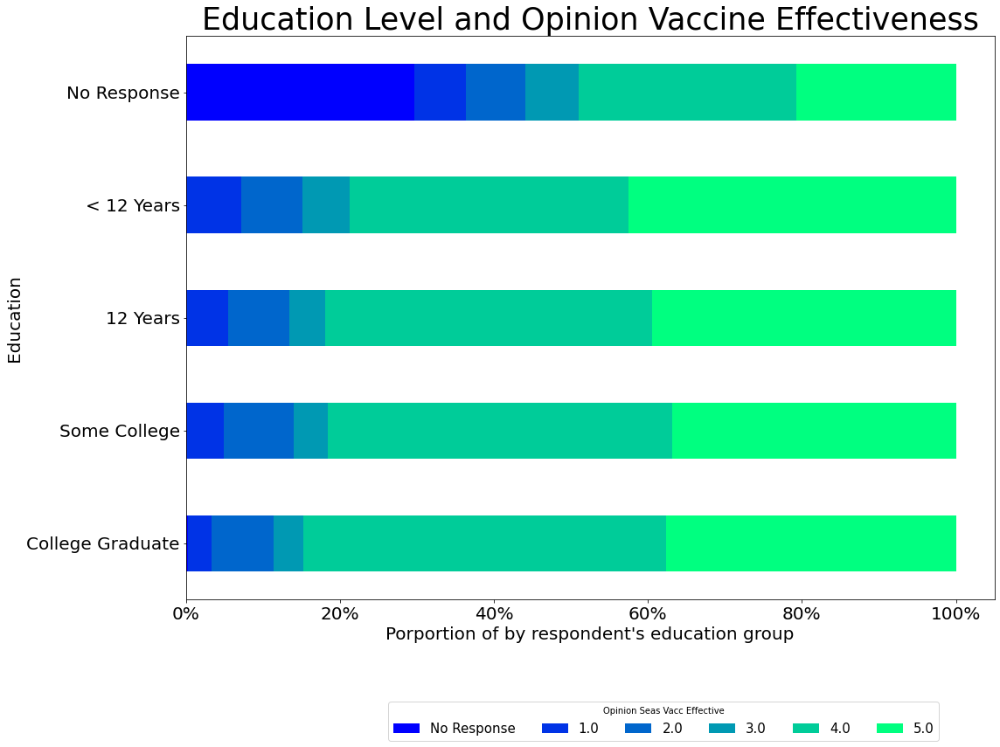

In [132]:
# Education level and opinion on vaccine effectiveness
features = ['education', 'opinion_seas_vacc_effective']
axis_order = ['No Response', '< 12 Years', '12 Years', 'Some College', 'College Graduate']
stacked_prop_plot(data, 
                  features, 
                  title='Education Level and Opinion Vaccine Effectiveness', 
                  axis_order = axis_order, 
                  save=True)

doctor_recc_seasonal,No Response,0.0,1.0
health_insurance,,,
No Response,0.146326,0.589539,0.264136
0,0.022465,0.787442,0.190092
1,0.025597,0.618256,0.356147


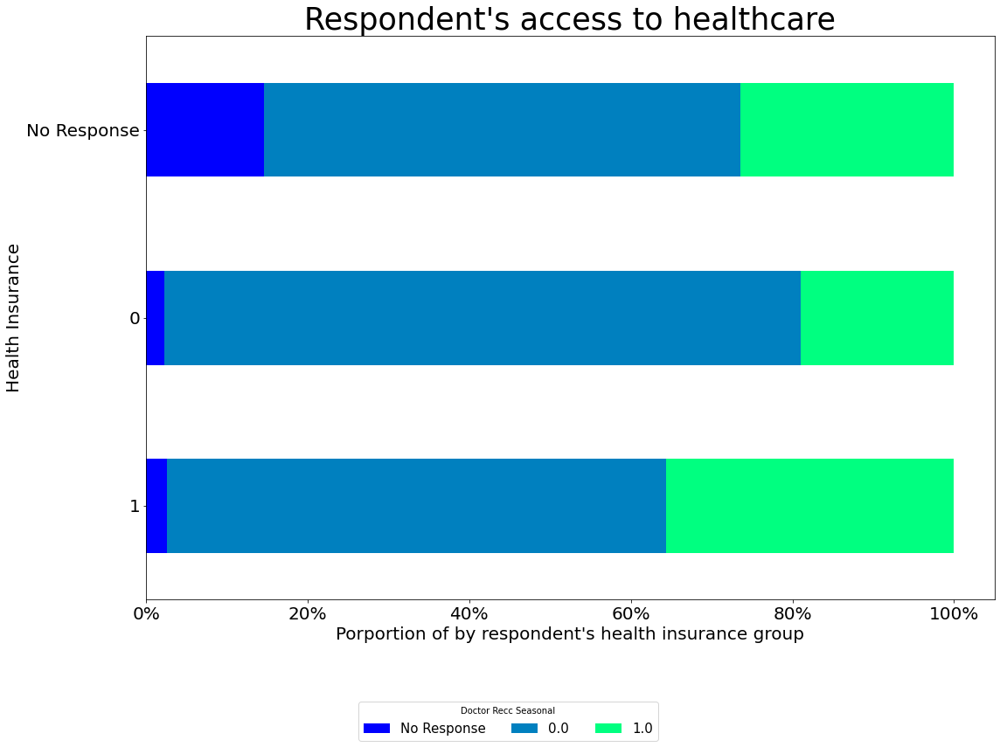

In [133]:
# Respondent's Healthcare access
features = ['health_insurance', 'doctor_recc_seasonal']
axis_order = ['No Response', 0, 1]
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Respondent's access to healthcare", 
                  save=True)

opinion_seas_risk,No Response,1.0,2.0,3.0,4.0,5.0
education,,,,,,
No Response,0.339730,0.191187,0.208244,0.040512,0.156361,0.063966
< 12 Years,0.002116,0.250529,0.264917,0.044435,0.250106,0.187897
12 Years,0.001380,0.241849,0.330171,0.024495,0.285492,0.116612
Some College,0.000852,0.248900,0.336788,0.020446,0.276303,0.116712
College Graduate,0.001684,0.193919,0.371298,0.022680,0.318709,0.091710


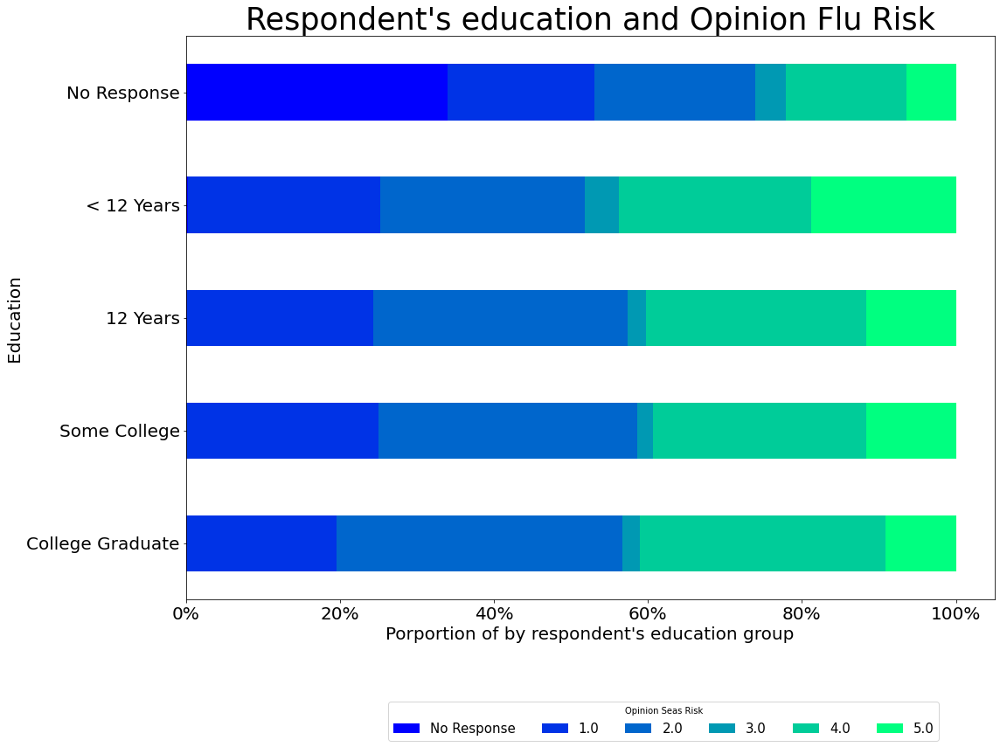

In [134]:
# Respondent's education and Opinion Flu Risk
features = ['education', 'opinion_seas_risk']
axis_order = ['No Response', '< 12 Years', '12 Years', 'Some College', 'College Graduate']
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Respondent's education and Opinion Flu Risk", 
                  save=True)

opinion_seas_risk,No Response,1.0,2.0,3.0,4.0,5.0
seasonal_vaccine,,,,,,
0,0.021931,0.330928,0.393288,0.021020,0.179933,0.052901
1,0.016164,0.100603,0.268677,0.030318,0.407077,0.177161


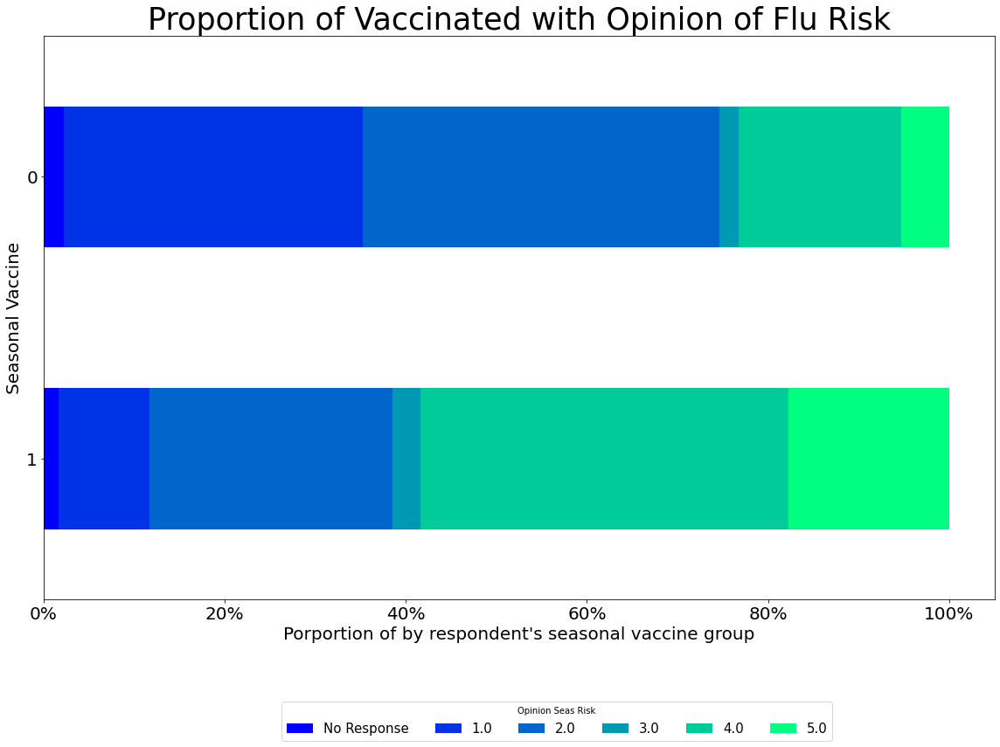

In [135]:
# Proportion of Vaccinated with Opinion of Flu Risk
features = ['seasonal_vaccine', 'opinion_seas_risk']
axis_order = [0, 1]
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Proportion of Vaccinated with Opinion of Flu Risk", 
                  save=True)

opinion_seas_vacc_effective,No Response,1.0,2.0,3.0,4.0,5.0
seasonal_vaccine,,,,,,
0,0.019969,0.072029,0.132077,0.061379,0.508198,0.206348
1,0.014234,0.015521,0.025814,0.027342,0.351910,0.565179


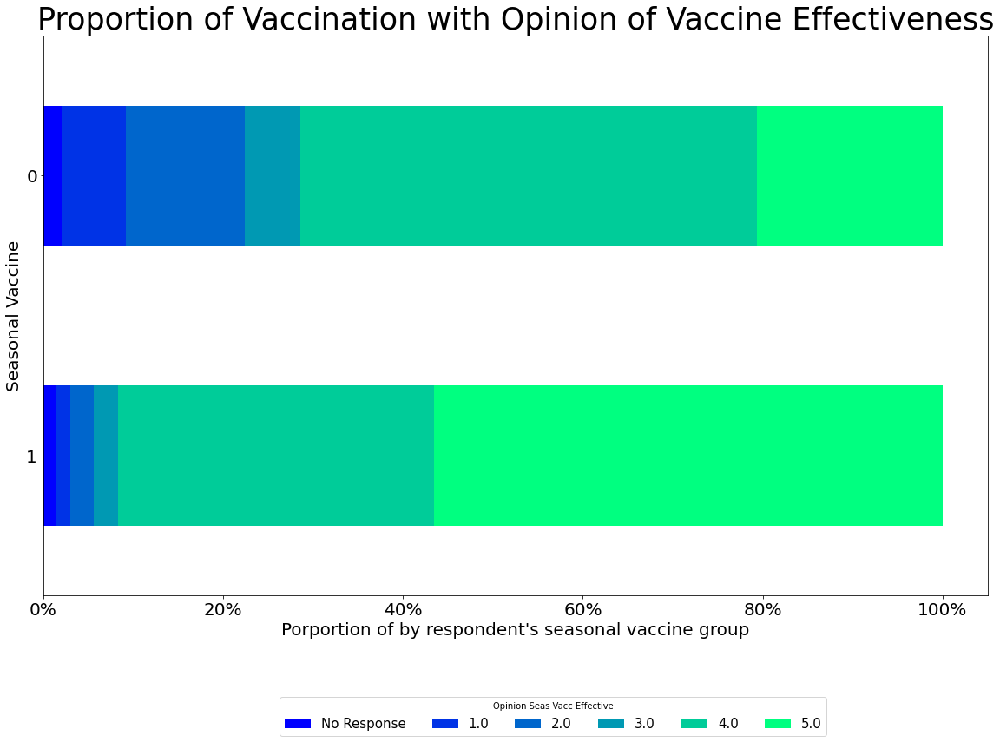

In [136]:
# Proportion of Vaccination with Opinion of Vaccine Effectiveness
features = ['seasonal_vaccine', 'opinion_seas_vacc_effective']
axis_order = [0, 1]
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Proportion of Vaccination with Opinion of Vaccine Effectiveness", 
                  save=True)

opinion_seas_vacc_effective,No Response,1.0,2.0,3.0,4.0,5.0
chronic_med_condition,,,,,,
No Response,0.428424,0.050463,0.045314,0.062822,0.240989,0.171988
0,0.001952,0.047924,0.092595,0.047382,0.464654,0.345495
1,0.001372,0.039506,0.062277,0.038546,0.387380,0.470919


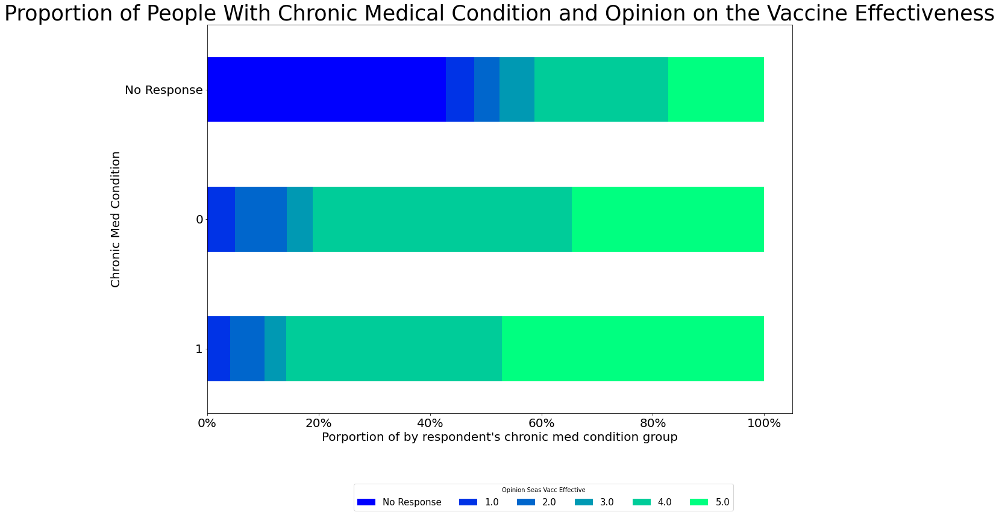

In [137]:
# Proportion of People with a chronic medical condition and their opinion on the vaccine effectiveness
features = ['chronic_med_condition', 'opinion_seas_vacc_effective']
axis_order = ['No Response', 0, 1]
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Proportion of People With Chronic Medical Condition and Opinion on the Vaccine Effectiveness",
                  save=True)

opinion_seas_risk,No Response,1.0,2.0,3.0,4.0,5.0
chronic_med_condition,,,,,,
No Response,0.491246,0.139032,0.162719,0.039135,0.133883,0.033986
0,0.001518,0.248130,0.368318,0.022986,0.271333,0.087715
1,0.001235,0.173114,0.274623,0.029492,0.342250,0.179287


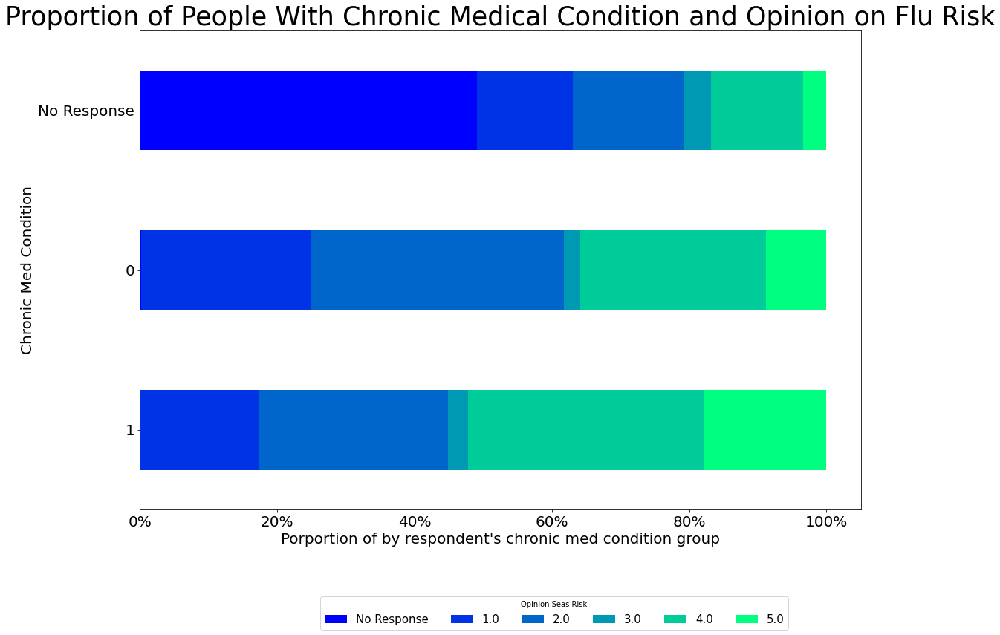

In [138]:
# Proportion of People with a chronic medical condition and their opinion on flu risk
features = ['chronic_med_condition', 'opinion_seas_risk']
axis_order = ['No Response', 0, 1]
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Proportion of People With Chronic Medical Condition and Opinion on Flu Risk",
                  save=True)

doctor_recc_seasonal,No Response,0.0,1.0
seasonal_vaccine,,,
0,0.098024,0.753643,0.148332
1,0.061198,0.458142,0.480659


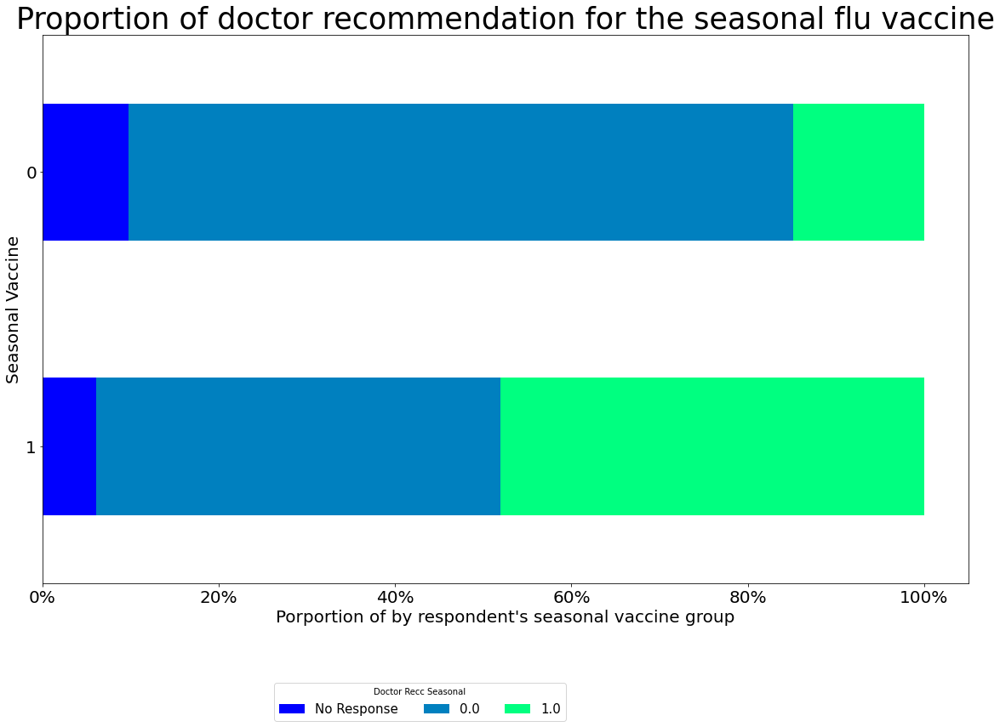

In [139]:
# Vaccination status and recommendation from their doctor
features = ['seasonal_vaccine', 'doctor_recc_seasonal']
axis_order = [0, 1]
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Proportion of doctor recommendation for the seasonal flu vaccine",
                  save=True)

seasonal_vaccine,1,0
age_group,,
65+ Years,0.673681,0.326319
55 - 64 Years,0.511235,0.488765
45 - 54 Years,0.401298,0.598702
35 - 44 Years,0.362526,0.637474
18 - 34 Years,0.284564,0.715436


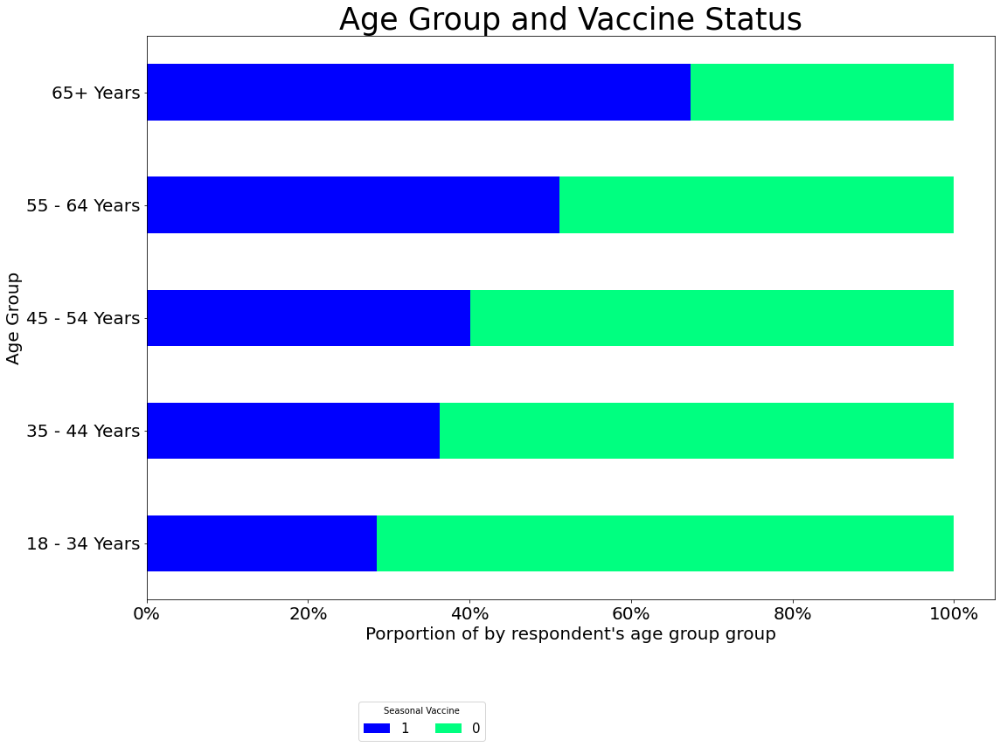

In [140]:

# Vaccination status and recommendation from their doctor
features = ['age_group', 'seasonal_vaccine']
axis_order = ['65+ Years',
              '55 - 64 Years',
              '45 - 54 Years',
              '35 - 44 Years',
              '18 - 34 Years']
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Age Group and Vaccine Status",
                  save=True)

In [141]:
axis_order = [e for e in data['income_poverty'].value_counts().index]
axis_order

['<= $75,000, Above Poverty', '> $75,000', 'Below Poverty']

seasonal_vaccine,1,0
income_poverty,,
"> $75,000",0.496769,0.503231
"<= $75,000, Above Poverty",0.476716,0.523284
Below Poverty,0.362625,0.637375


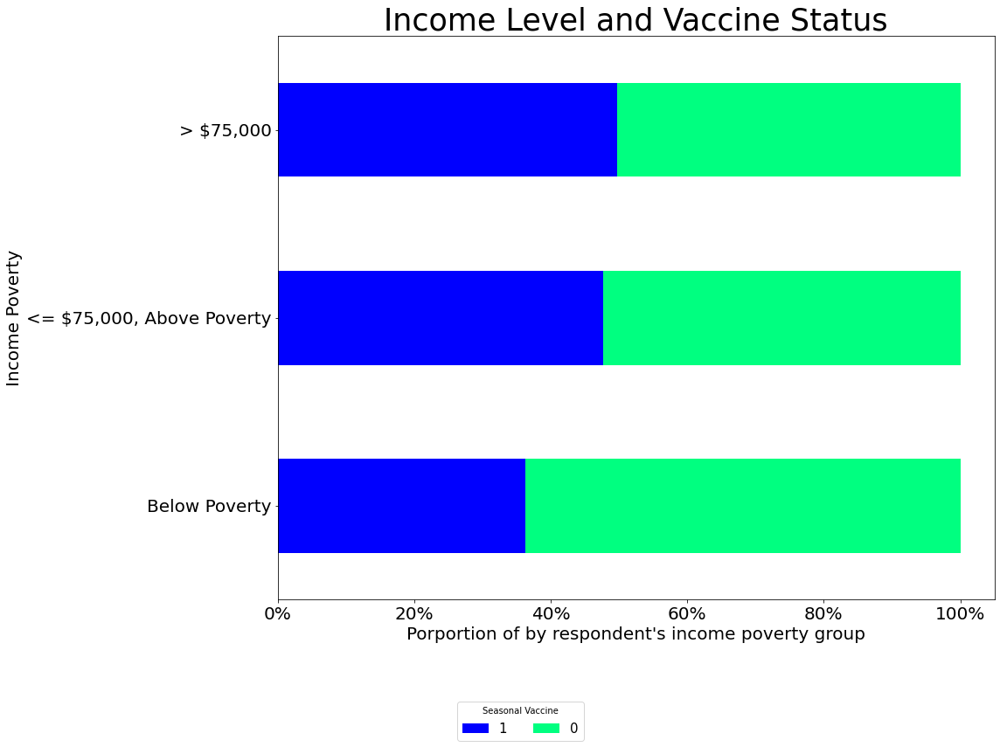

In [142]:
# Vaccination status and income level
features = ['income_poverty', 'seasonal_vaccine']
axis_order = ['> $75,000',
              '<= $75,000, Above Poverty',
              'Below Poverty']
stacked_prop_plot(data, 
                  features, 
                  axis_order, 
                  title="Income Level and Vaccine Status",
                  save=True)